In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import LogNorm
import matplotlib.colors as colors
import matplotlib.patches as patches
import astropy.units as u
import astropy.constants as const
from lmfit.models import gaussian, expgaussian
from scipy.special import erf
from mhealpy import HealpixMap

from random import choices

# Matplotlib style template
## For black, set #000000. For navy, set #002060
defaultcolor = '#002060'
from matplotlib import cycler
plt.rcParams.update({'text.color': defaultcolor, 'axes.labelcolor': defaultcolor, 
                     'xtick.color': defaultcolor, 'ytick.color': defaultcolor,
                     'axes.prop_cycle': cycler(color=['b', 'r', 'limegreen']),
                     'font.family':'serif', 'font.serif': 'Times New Roman',
                     'font.size': 22, 'lines.linewidth': 3,
                     'figure.figsize': (9.6, 5.4), 'figure.dpi': 80})

In [2]:
tiny = 1e-15
s2 = np.sqrt(2)
def expgaussianleft(x, amplitude=1, center=0, sigma=1.0, gamma=1.0):
    '''
    Standard implementation of expgaussian in lmfit.lineshapes is left-skewed

    Here, return a right-skewed, exponentially modified Gaussian.

    For more information, see:
    https://en.wikipedia.org/wiki/Exponentially_modified_Gaussian_distribution
    '''
    gss = -gamma*sigma*sigma
    arg1 = -gamma*(center + gss/2.0 - x)
    arg2 = (center + gss - x)/max(tiny, (s2*sigma))
    return amplitude*(gamma/2) * np.exp(arg1) * (erf(arg2) + 1)

### Visualizing Compton Circle

In [3]:
def spherical_to_cartesian(psi, chi):
    # Convert spherical to Cartesian coordinates
    x = np.sin(psi) * np.cos(chi)
    y = np.sin(psi) * np.sin(chi)
    z = np.cos(psi)
    return np.array([x, y, z])

def cartesian_to_spherical(x, y, z):
    # Convert Cartesian to spherical coordinates
    psi = np.arctan2(np.sqrt(x**2 + y**2), z)  # Inclination angle
    chi = np.arctan2(y, x)  # Azimuth angle
    return psi, chi

def rotate_to_sphere(point, center):
    # Calculate orthogonal basis vectors on the sphere's surface
    z_axis = center / np.linalg.norm(center)  # Normalize center to unit vector
    x_axis = np.cross(z_axis, np.array([0, 0, 1]))
    if np.linalg.norm(x_axis) < 1e-10:
        x_axis = np.array([1, 0, 0])  # Handle the special case when center is (0, 0, 1)
    x_axis /= np.linalg.norm(x_axis)
    y_axis = np.cross(z_axis, x_axis)
    
    # Rotation matrix from tangent plane to sphere surface
    R = np.array([x_axis, y_axis, z_axis]).T
    
    # Rotate the point
    rotated_point = R @ point
    return rotated_point

def circle_on_sphere(psi, chi, phi, num_points=100):
    # Center point in Cartesian coordinates
    center = spherical_to_cartesian(psi, chi)
    
    # Generate circle points on the tangent plane
    angles = np.linspace(0, 2 * np.pi, num_points)
    x_tangent = np.cos(angles) * np.sin(phi)
    y_tangent = np.sin(angles) * np.sin(phi)
    z_tangent = np.cos(phi) * np.ones(num_points)
    
    # Rotate tangent circle points to sphere surface
    circle_points = []
    for i in range(num_points):
        point = np.array([x_tangent[i], y_tangent[i], z_tangent[i]])
        point = rotate_to_sphere(point, center)
        circle_points.append(point)
    
    return np.array(circle_points)

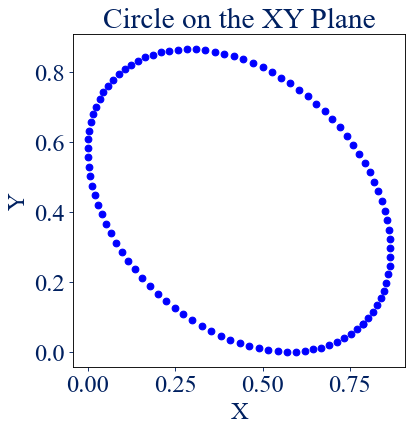

In [4]:
def plot_circle_on_xy_plane(circle_points):
    # Project circle points onto the XY plane
    x = circle_points[:, 0]
    y = circle_points[:, 1]

    plt.figure()
    plt.plot(x, y, 'o')
    plt.title('Circle on the XY Plane')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()

# Example usage
psi = np.pi / 4  # 45 degrees
chi = np.pi / 4  # 45 degrees
phi = np.pi / 6  # 30 degrees
circle_points = circle_on_sphere(psi, chi, phi)

plot_circle_on_xy_plane(circle_points)

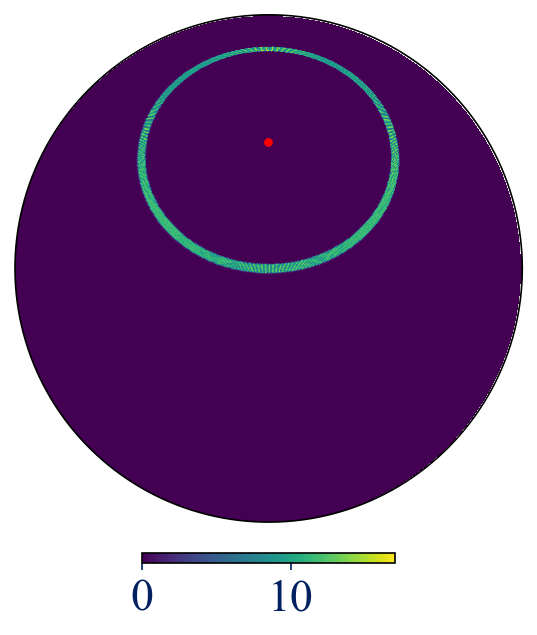

In [5]:
# Define the grid
nside = 256
scheme = 'nested'

# Define the grid and initialize
m = HealpixMap(nside = nside, scheme = scheme, dtype = int)

# Define center of circle
psi = np.pi / 3  # radians
chi = 0  # radians

# Define scatter angle
phi = np.deg2rad(np.linspace(29, 31, 101))

for angle in phi:
    # Ensure input angles are in radians
    circle_points = circle_on_sphere(psi, chi, angle, num_points=800)

    # Get the pixel where a point lands in the current scheme
    theta, phi = cartesian_to_spherical(*circle_points.T)

    # Get the pixel where a point lands in the current scheme
    sample_pix = m.ang2pix(theta, phi)

    # Add the count
    m[sample_pix] += 1

# Plot
fig = plt.figure(dpi = 150)
ax = fig.add_subplot(1,2,1, projection = 'orthview')
m.plot(ax=ax)
ax.scatter(np.rad2deg(chi), 90 - np.rad2deg(psi), marker='o', c='r', s=10, transform=ax.get_transform('world'))

plt.show()

### Visualizing Compton Scatter Angle

In [6]:
m_e = const.m_e
c = const.c
e = const.e.si
eps0 = const.eps0
PI = np.pi
r_e = 1 / (4 * PI * eps0) * (e**2 / (m_e * c**2))
r_e = r_e.to(u.fm)

def Compton_scattering_energy(Ein, phi):
    a = Ein / (m_e * c**2) * (1 - np.cos(phi))
    b = 1 + a   # denominator
    Eout = Ein / b
    return Eout

def Compton_scattering_cross_section(Ein, phi, Eout):
    a = 1/2 * r_e**2 * (Eout/Ein)**2
    b = Ein/Eout + Eout/Ein - np.sin(phi)**2
    return a*b

def Compton_PDF(Ein, phi):
    Eout = Compton_scattering_energy(Ein, phi)
    cross_section = Compton_scattering_cross_section(Ein, phi, Eout)
    pdf = (cross_section[:-1] + cross_section[1:]) / 2 / cross_section.sum() / np.diff(-phi)
    return pdf

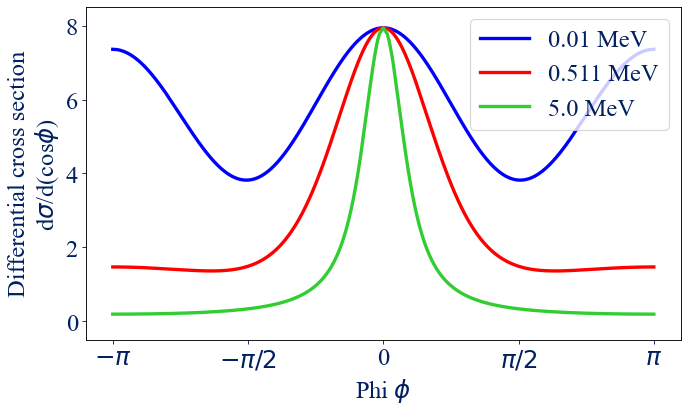

In [8]:
Ein = np.array([0.01, 0.511, 5]) * u.MeV  # TODO: Add whitenoise
# Ein = np.array([1.122, 1.157, 1.192]) * u.MeV

# To ensure that hemisphere is equally sampled
# cosphi = np.random.uniform(-1, 1, 10000)
cosphi = np.linspace(-1, 1, 2001)
phi_sym = np.concatenate([np.arccos(cosphi)[:-1], np.arccos(cosphi) - PI])  # [:-1] to avoid double counting at zero

Eout = np.zeros([Ein.shape[0], phi_sym.shape[0]]) * Ein.unit
cross_section = np.zeros(Eout.shape)
for i, E in enumerate(Ein):
    Eout[i, :] = Compton_scattering_energy(Ein = E, phi = phi_sym)
    cross_section[i, :] = Compton_scattering_cross_section(E, phi_sym, Eout[i, :])
    plt.plot(phi_sym, cross_section[i], label=f'{E}')

plt.xticks([-PI, -PI/2, 0, PI/2, PI])
plt.gca().set_xticklabels([f'$-\\pi$', f'$-\\pi/2$', f'0', f'$\\pi/2$', f'$\\pi$'])
plt.xlabel(f'Phi $\\phi$')
plt.ylabel(f'Differential cross section\nd$\\sigma$/d(cos$\\phi$)')

plt.ylim([-0.5, 8.5])
plt.legend()
plt.show()

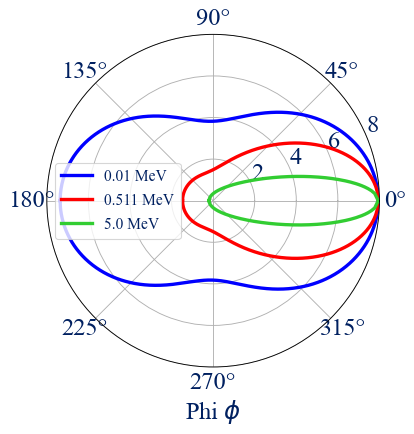

In [9]:
Ein = np.array([0.01, 0.511, 5]) * u.MeV
# Ein = np.array([1.122, 1.157, 1.192]) * u.MeV

for i, E in enumerate(Ein):
    plt.polar(phi_sym, cross_section[i], label=f'{E}')
plt.ylim(top=8)
plt.xlabel(f'Phi $\\phi$')

plt.legend(fontsize=14)
plt.show()

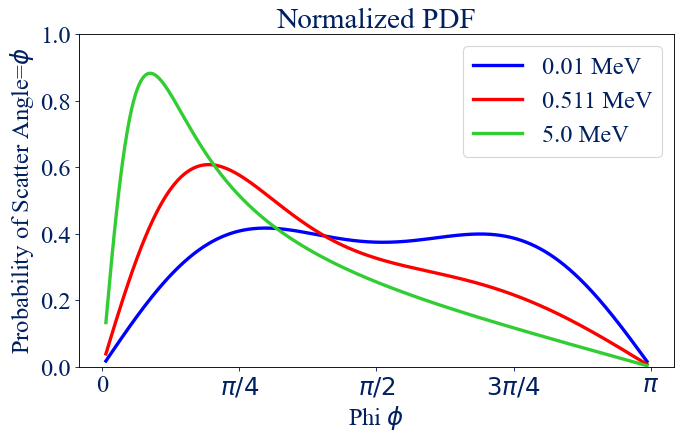

In [10]:
n = len(phi_sym)//2 + 1
phi = phi_sym[:n]

for i, E in enumerate(Ein):
    bincenters = (phi[:-1] + phi[1:])/2
    pdf = Compton_PDF(E, phi)
    plt.plot(bincenters, pdf, label=f'{E}')

plt.xticks([0, PI/4, PI/2, 3*PI/4, PI])
plt.gca().set_xticklabels([f'0', f'$\\pi/4$', f'$\\pi/2$', f'$3\\pi/4$', f'$\\pi$'])
plt.xlabel(f'Phi $\\phi$')
plt.ylabel(f'Probability of Scatter Angle=$\phi$')
plt.title('Normalized PDF')

plt.ylim([0, 1])
plt.legend()
plt.show()

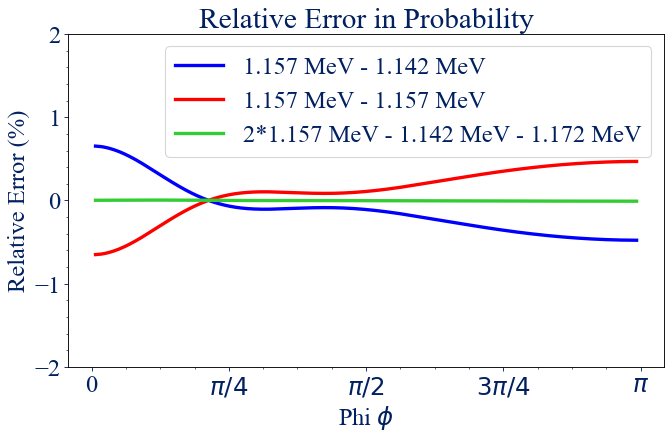

In [11]:
Ein = np.array([1.142, 1.157, 1.172]) * u.MeV

p = np.zeros([3,len(phi)-1])
for i, E in enumerate(Ein):
    p[i] = Compton_PDF(E, phi)
    
plt.plot(bincenters, (1 - p[0]/p[1])*100, label=f'{Ein[1]} - {Ein[0]}')
plt.plot(bincenters, (1 - p[2]/p[1])*100, label=f'{Ein[1]} - {Ein[1]}')

plt.plot(bincenters, (2 - (p[0]+p[2])/p[1])*100, label=f'2*{Ein[1]} - {Ein[0]} - {Ein[2]}')

plt.xticks([0, PI/4, PI/2, 3*PI/4, PI])
plt.gca().set_xticklabels([f'0', f'$\\pi/4$', f'$\\pi/2$', f'$3\\pi/4$', f'$\\pi$'])
plt.xlabel(f'Phi $\\phi$')
plt.ylabel('Relative Error (%)')
plt.title(f'Relative Error in Probability')

plt.ylim([-2, 2])
plt.minorticks_on()
plt.legend()
plt.show()

### Event Circle Broadening

In [173]:
import matplotlib as mpl
mpl.rcParams['axes.linewidth'] = 2
np.arange(-11, 12, 2)

array([-11,  -9,  -7,  -5,  -3,  -1,   1,   3,   5,   7,   9,  11])

In [174]:
limrange = np.arange(-13, 14, 2)

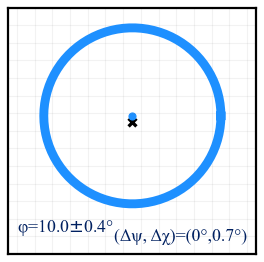

In [175]:
theta = np.deg2rad(np.linspace(0, 360, 181, endpoint=True))
r = 10
# x0 = 0.3
# y0 = 0.2
x0 = 0.04
y0 = 0.7
c = 'dodgerblue'

x = x0 + r * np.cos(theta)
y = y0 + r * np.sin(theta)

plt.figure(figsize=(4,4))
for i in limrange:
    plt.axvline(i, lw=1, alpha=0.1, color='gray')
    plt.axhline(i, lw=1, alpha=0.1, color='gray')
plt.xticks([])
plt.yticks([])
plt.scatter(0, 0, c='k', marker='x', s=50)
plt.plot(x, y, c=c, lw=8)
plt.scatter(x0, y0, c=c, s=40)
plt.xlim([limrange[0]-1, limrange[-1]+1])
plt.ylim([limrange[0]-2, limrange[-1]])
plt.text(limrange[0], limrange[0]+1, f'φ={r*1.0}$\pm$0.4°', va='center', ha='left', fontdict={'fontsize': 16})
plt.text(limrange[-1], limrange[0], f'(Δψ, Δχ)=(0°,{y0:.1f}°)', va='center', ha='right', fontdict={'fontsize': 16})
plt.show()

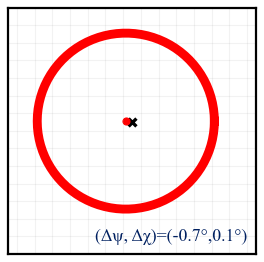

In [176]:
theta = np.deg2rad(np.linspace(0, 360, 181, endpoint=True))
r = 10
# x0 = -0.2
# y0 = 0.4
x0 = -0.7
y0 = 0.1
c = 'red'

x = x0 + r * np.cos(theta)
y = y0 + r * np.sin(theta)

plt.figure(figsize=(4,4))
for i in limrange:
    plt.axvline(i, lw=1, alpha=0.1, color='gray')
    plt.axhline(i, lw=1, alpha=0.1, color='gray')
plt.xticks([])
plt.yticks([])
plt.scatter(0, 0, c='k', marker='x', s=50)
plt.plot(x, y, c=c, lw=8)
plt.scatter(x0, y0, c=c, s=40)
plt.xlim([limrange[0]-1, limrange[-1]+1])
plt.ylim([limrange[0]-2, limrange[-1]])
# plt.text(limrange[0], limrange[0]+1, f'φ={r}°', va='center', ha='left', fontdict={'fontsize': 14})
plt.text(limrange[-1], limrange[0], f'(Δψ, Δχ)=({x0:.1f}°,{y0:.1f}°)', va='center', ha='right', fontdict={'fontsize': 16})
plt.show()

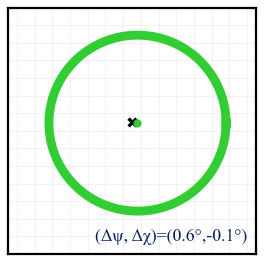

In [177]:
theta = np.deg2rad(np.linspace(0, 360, 181, endpoint=True))
r = 10
# x0 = 0.1
# y0 = -0.3
x0 = 0.62
y0 = -0.13
c = 'limegreen'

x = x0 + r * np.cos(theta)
y = y0 + r * np.sin(theta)

plt.figure(figsize=(4,4))
for i in limrange:
    plt.axvline(i, lw=1, alpha=0.1, color='gray')
    plt.axhline(i, lw=1, alpha=0.1, color='gray')
plt.xticks([])
plt.yticks([])
plt.scatter(0, 0, c='k', marker='x', s=50)
plt.plot(x, y, c=c, lw=8)
plt.scatter(x0, y0, c=c, s=40)
plt.xlim([limrange[0]-1, limrange[-1]+1])
plt.ylim([limrange[0]-2, limrange[-1]])
# plt.text(limrange[0], limrange[0]+1, f'φ={r}°', va='center', ha='left', fontdict={'fontsize': 14})
plt.text(limrange[-1], limrange[0], f'(Δψ, Δχ)=({x0:.1f}°,{y0:.1f}°)', va='center', ha='right', fontdict={'fontsize': 16})
plt.show()

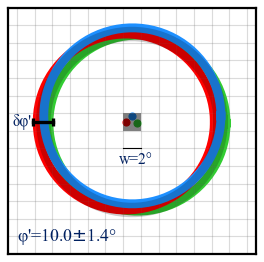

In [214]:
theta = np.deg2rad(np.linspace(0, 360, 181, endpoint=True))
r = 10.
plt.figure(figsize=(4,4))

# for x0, y0, c in zip([0.1, -0.2, 0.3], [-0.3, 0.4, 0.2], ['limegreen', 'red', 'dodgerblue']):
for x0, y0, c in zip([0.62, -0.7, 0.04], [-0.13, 0., 0.7], ['limegreen', 'red', 'dodgerblue']):

    x = x0 + r * np.cos(theta)
    y = y0 + r * np.sin(theta)

    for i in limrange:
        plt.axvline(i, lw=1, alpha=0.1, color='gray')
        plt.axhline(i, lw=1, alpha=0.1, color='gray')
    plt.plot(x, y, c=c, lw=8)
    plt.scatter(x0, y0, c=c, s=40)

plt.fill_between([-1, 1], -1, 1, facecolor='k', alpha=0.5)
x = r * np.cos(theta)
y = r * np.sin(theta)
plt.plot(x, y, c='k', lw=13, alpha=0.2)
plt.xticks([])
plt.yticks([])
plt.xlim([limrange[0]-1, limrange[-1]+1])
plt.ylim([limrange[0]-2, limrange[-1]])
# plt.text(limrange[0], limrange[0]+1, f'φ={r}°', va='center', ha='left', fontdict={'fontsize': 14})
# plt.text(limrange[-1], limrange[0]+1, f'(Δψ, Δχ)=({x0}°,{y0}°)', va='center', ha='right', fontdict={'fontsize': 14})
plt.plot([-1, 1], [-3, -3], c='k', lw=1)
plt.text(x=0.4, y=-3.4, s=f'w=2°', ha='center', va='top', fontdict={'fontsize': 14})
plt.errorbar([-11.2, -8.9], [0]*2, [0.4]*2, c='k', lw=3)
plt.text(x=-11.3, y=0, s=f'δφ\'', ha='right', va='center', fontdict={'fontsize': 14})
plt.text(limrange[0], limrange[0], f'φ\'={r}$\pm$1.4°', va='center', ha='left', fontdict={'fontsize': 16})
plt.show()

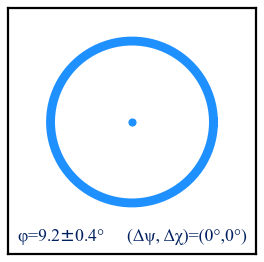

In [197]:
theta = np.deg2rad(np.linspace(0, 360, 181, endpoint=True))
x0 = 0
y0 = 0
r = 9.2
c = 'dodgerblue'

x = x0 + r * np.cos(theta)
y = y0 + r * np.sin(theta)

plt.figure(figsize=(4,4))
plt.plot(x, y, c=c, lw=8)
plt.scatter(x0, y0, c=c, s=40)

# plt.fill_between([-1, 1], -1, 1, facecolor='k', alpha=0.5)
x = r * np.cos(theta)
y = r * np.sin(theta)
# plt.plot(x, y, c='k', lw=10, alpha=0.3)
plt.xticks([])
plt.yticks([])
# plt.scatter(0, 0, c='k', marker='x', s=50)
plt.xlim([limrange[0]-1, limrange[-1]+1])
plt.ylim([limrange[0]-2, limrange[-1]])
plt.text(limrange[0], limrange[0], f'φ={r}$\pm$0.4°', va='center', ha='left', fontdict={'fontsize': 16})
plt.text(limrange[-1], limrange[0], f'(Δψ, Δχ)=({x0}°,{y0}°)', va='center', ha='right', fontdict={'fontsize': 16})
plt.show()

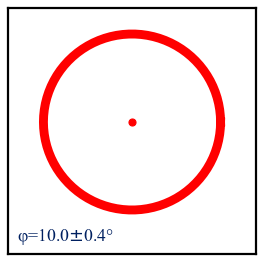

In [198]:
theta = np.deg2rad(np.linspace(0, 360, 181, endpoint=True))
x0 = 0
y0 = 0
r = 10.
c = 'red'

x = x0 + r * np.cos(theta)
y = y0 + r * np.sin(theta)

plt.figure(figsize=(4,4))
plt.plot(x, y, c=c, lw=8)
plt.scatter(x0, y0, c=c, s=40)

# plt.fill_between([-1, 1], -1, 1, facecolor='k', alpha=0.5)
x = r * np.cos(theta)
y = r * np.sin(theta)
# plt.plot(x, y, c='k', lw=10, alpha=0.3)
plt.xticks([])
plt.yticks([])
# plt.scatter(0, 0, c='k', marker='x', s=50)
plt.xlim([limrange[0]-1, limrange[-1]+1])
plt.ylim([limrange[0]-2, limrange[-1]])
plt.text(limrange[0], limrange[0], f'φ={r}$\pm$0.4°', va='center', ha='left', fontdict={'fontsize': 16})
# plt.text(limrange[-1], limrange[0]+1, f'(Δψ, Δχ)=({x0}°,{y0}°)', va='center', ha='right', fontdict={'fontsize': 14})
plt.show()

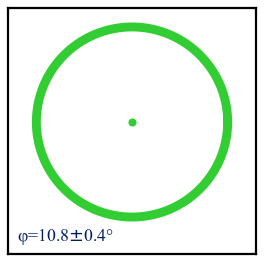

In [199]:
theta = np.deg2rad(np.linspace(0, 360, 181, endpoint=True))
x0 = 0
y0 = 0
r = 10.8
c = 'limegreen'

x = x0 + r * np.cos(theta)
y = y0 + r * np.sin(theta)

plt.figure(figsize=(4,4))
plt.plot(x, y, c=c, lw=8)
plt.scatter(x0, y0, c=c, s=40)

# plt.fill_between([-1, 1], -1, 1, facecolor='k', alpha=0.5)
x = r * np.cos(theta)
y = r * np.sin(theta)
# plt.plot(x, y, c='k', lw=10, alpha=0.3)
plt.xticks([])
plt.yticks([])
# plt.scatter(0, 0, c='k', marker='x', s=50)
plt.xlim([limrange[0]-1, limrange[-1]+1])
plt.ylim([limrange[0]-2, limrange[-1]])
plt.text(limrange[0], limrange[0], f'φ={r}$\pm$0.4°', va='center', ha='left', fontdict={'fontsize': 16})
# plt.text(limrange[-1], limrange[0]+1, f'(Δψ, Δχ)=({x0}°,{y0}°)', va='center', ha='right', fontdict={'fontsize': 14})
plt.show()

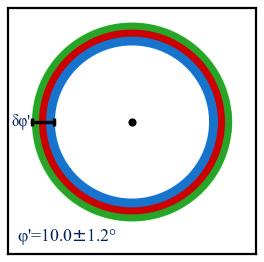

In [208]:
theta = np.deg2rad(np.linspace(0, 360, 181, endpoint=True))
x0 = 0
y0 = 0
plt.figure(figsize=(4,4))

for r, c in zip([10.8, 10, 9.2], ['limegreen', 'red', 'dodgerblue']):

    x = x0 + r * np.cos(theta)
    y = y0 + r * np.sin(theta)

    # for i in np.arange(-11, 12, 2):
    #     plt.axvline(i, lw=1, alpha=0.1, color='gray')
    #     plt.axhline(i, lw=1, alpha=0.1, color='gray')
    plt.plot(x, y, c=c, lw=8)

plt.scatter(x0, y0, c='k', s=40)

# plt.fill_between([-1, 1], -1, 1, facecolor='k', alpha=0.5)
x = 10 * np.cos(theta)
y = 10 * np.sin(theta)
plt.plot(x, y, c='k', lw=20, alpha=0.2)
plt.xticks([])
plt.yticks([])
# plt.scatter(0, 0, c='k', marker='x', s=50)
plt.errorbar([-11.25, -8.85], [0]*2, [0.4]*2, c='k', lw=3)
plt.text(x=-11.5, y=0, s=f'δφ\'', ha='right', va='center', fontdict={'fontsize': 14})
plt.xlim([limrange[0]-1, limrange[-1]+1])
plt.ylim([limrange[0]-2, limrange[-1]])
plt.text(limrange[0], limrange[0], f'φ\'=10.0$\pm$1.2°', va='center', ha='left', fontdict={'fontsize': 16})
# plt.text(limrange[-1], limrange[0]+1, f'(Δψ, Δχ)=({x0}°,{y0}°)', va='center', ha='right', fontdict={'fontsize': 14})
plt.show()

In [98]:
np.sqrt(6/0.86)

2.6413527189768713

In [102]:
8.3/2.64

3.143939393939394

### Adaptive Binning

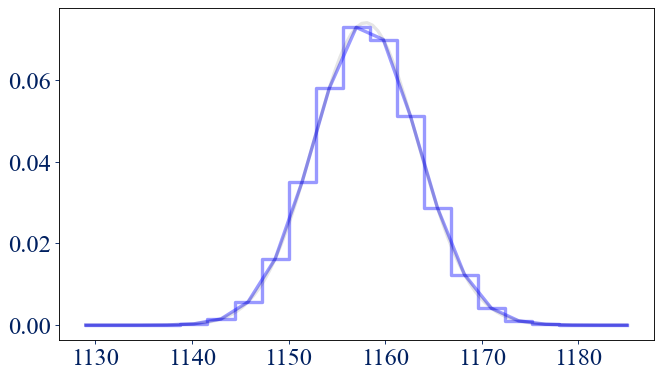

In [17]:
x = np.linspace(1129, 1185, 21)
x0 = np.linspace(x.min(), x.max(), 101)
plt.step(x, expgaussian(x, center=1157, sigma=5.3), where='mid', alpha=0.4)
plt.plot(x, expgaussian(x, center=1157, sigma=5.3), alpha=0.4, c='b')
plt.plot(x0, expgaussian(x0, center=1157, sigma=5.3), alpha=0.1, c='k')
# plt.step(x+1, expgaussian(x+1, center=1157, sigma=5.3), where='mid', alpha=0.4)
# plt.step(x-1, expgaussian(x-1, center=1157, sigma=5.3), where='mid', alpha=0.4)

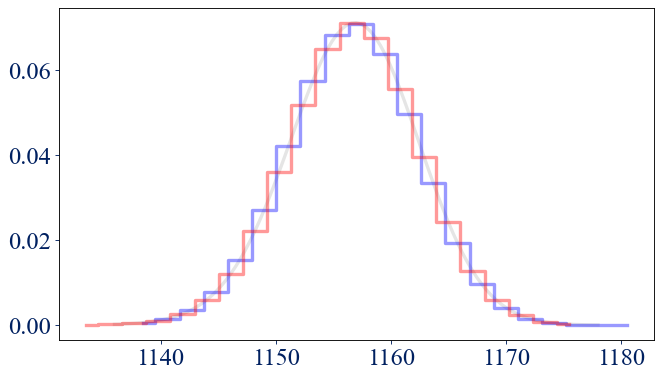

In [43]:
x = np.linspace(1136, 1178, 21)
x0 = np.linspace(x.min(), x.max(), 101)
# plt.step(x, expgaussianleft(x, center=1157, sigma=5.3), where='mid', alpha=0.4)
# plt.plot(x, expgaussianleft(x, center=1157, sigma=5.3), alpha=0.4, c='b')
plt.plot(x0, expgaussianleft(x0, center=1157+1.7, sigma=5.3, gamma=0.5), alpha=0.1, c='k')
plt.step(x+2.5, expgaussianleft(x+2.5, center=1157+1.7, sigma=5.3, gamma=0.5), where='mid', alpha=0.4)
plt.step(x-2.5, expgaussianleft(x-2.5, center=1157+1.7, sigma=5.3, gamma=0.5), where='mid', alpha=0.4)

In [26]:
np.sqrt((58/2.355)**2 + (9/2.355)**2)

24.923194209476332

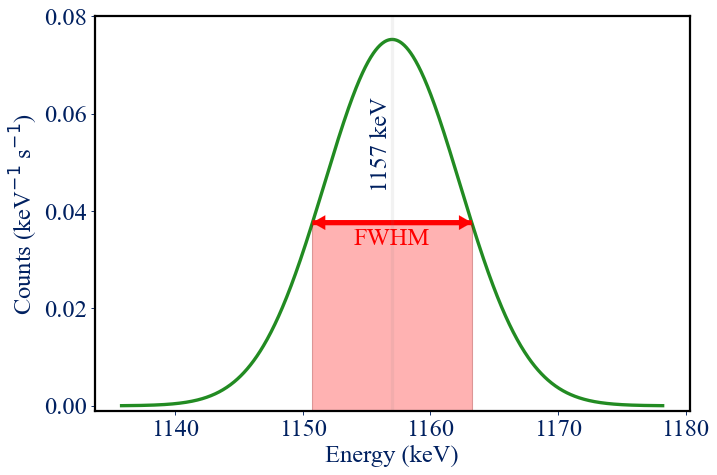

In [79]:
import numpy as np
import matplotlib.pyplot as plt

import matplotlib as mpl
mpl.rcParams['axes.linewidth'] = 2

# Parameters for the Gaussian distribution
mu = 1157  # mean
sigma = 5.3  # standard deviation

# Create an array of x values
x = np.linspace(mu - 4*sigma, mu + 4*sigma, 1000)

# Create the Gaussian distribution
amplitude = 1/(sigma * np.sqrt(2 * np.pi))
y = amplitude * np.exp(-0.5 * ((x - mu)/sigma)**2)

# Calculate FWHM
fwhm = 2 * np.sqrt(2 * np.log(2)) * sigma

# Get the value of the Gaussian at FWHM/2
height = amplitude * np.exp(-0.5 * ((fwhm/2)/sigma)**2)

# Uniform background value
background = 0#100 * amplitude

plt.figure(figsize=(9.6, 6.4))

# Plot the Gaussian with background
plt.plot(x, y + background, c='forestgreen', label='Gaussian signal', zorder=1)
plt.axvline(mu, alpha=0.1, c='gray')
plt.text(mu, 0.045, '1157 keV', rotation=90, ha='right')

# Add a truncated rectangle to denote the FWHM region
plt.fill_betweenx([background - 0.01, background + height], mu - fwhm/2, mu + fwhm/2, color='red', alpha=0.3, label='FWHM region', edgecolor='darkred')
plt.ylim([-0.001, 0.08])
plt.text(mu, background + height - 0.001, 'FWHM', color='r', va='top', ha='center')
plt.arrow(mu - fwhm/2, background + height, fwhm, 0, 
          head_width = 0.003, head_length = 1, length_includes_head = True, 
          color='r', lw=0.1)
plt.arrow(mu + fwhm/2, background + height, -fwhm, 0, 
          head_width = 0.003, head_length = 1, length_includes_head = True, 
          color='r', lw=0.1)

# Add labels and legend
plt.xlabel('Energy (keV)')
plt.ylabel('Counts (keV$^{-1}$ s$^{-1}$)')
# plt.ylabel('Probability Density')
# plt.title('Gaussian Distribution with Background and Truncated FWHM Region')
# plt.legend(loc='upper right', fontsize=14)

# Show the plot
plt.show()


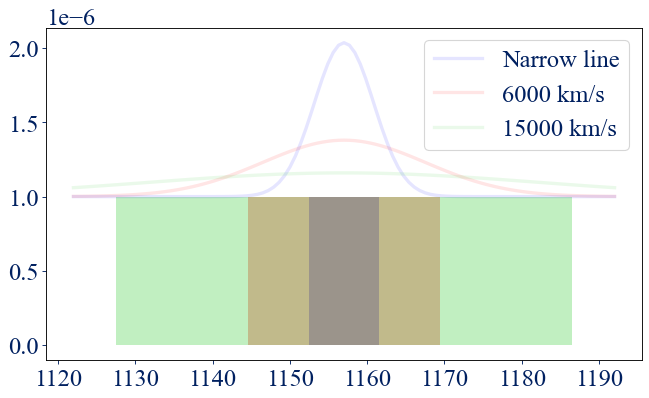

In [65]:
x = np.linspace(1122, 1192, 101)
bg = 1e-6

amp = 1e-5
mu = 1157  # mean
sigma = 3.85  # standard deviation

for sigma, label in zip([3.85, 10.5, 25], ['Narrow line', '6000 km/s', '15000 km/s']):
# for sigma, label in zip([3.85], ['Narrow line']):
    y = gaussian(x, amp, mu, sigma) + bg
    plt.plot(x, y, alpha=0.1, label=label)

    fwhm = 2 * np.sqrt(2 * np.log(2)) * sigma
    height = amp * np.exp(-0.5 * ((fwhm/2)/sigma)**2)
    plt.fill_betweenx([0, bg], mu - fwhm/2, mu + fwhm/2, alpha=0.3)

absdiff = np.abs(1157-x0)
# plt.plot(x, bg + gaussian(0, amplitude=1e-5, sigma=3.85)/2*np.where(absdiff <= 5, 1, 0))
plt.legend()
# plt.ylim([])
plt.show()

### Flux Sensitivity

In [3]:
9/2.355, 15e3/3e5*1157/2.355

(3.821656050955414, 24.56475583864119)

In [4]:
def F(M, d, t):
    return 5.5e-5 * (M/1e-5) * (d/4)**(-2) * np.exp(-t/86)

In [5]:
def calc_d(F, M, t):
    return 4*np.sqrt((5.5e-5/F) * (M/1e-5) * np.exp(-t/86))

In [6]:
F(2.4e-4,3.4,340) * 0.999

3.502058397358267e-05

In [6]:
SNR = np.array(['G1.9+0.3', 'Kepler', 'Tycho', 'SN 1181', 'SN 1885A (M31)',
                'SNR 0509-67.5 (LMC)', 'SNR 0519-69.0 (LMC)',
                'SN 1006', 
                ])
M = np.array([1e-5, 1e-4, 1e-4, 1e-2, 1e-2, 1e-4, 1e-4, 
              1e-4
              ])
d = np.array([8.5, 5.0, 2.75, 2.3, 766, 49, 50, 
              2.18
              ])
derr = np.array([0,1,0.25,0.14,60, 3, 5, 
                 0.1
                 ])
t = 2028 - np.array([1898, 1604, 1572, 1181, 1885, 1718, 1428, 
                     1006
                     ])
terr = np.array([8,0,0,0,0,30,50,
                 0
                 ])

# SNR = np.array(['G1.9+0.3', 'Kepler', 'Tycho', 'SN 1181', 'SN 1885A'])
# M = np.array([1e-5, 1e-4, 1e-4, 1e-2, 1e-2])
# d = np.array([8.5, 5.0, 2.75, 2.3, 766])
# derr = np.array([0,1,0.25,0.14,60])
# t = 2028 - np.array([1898, 1604, 1572, 1181, 1885])
# terr = np.array([8,0,0,0,0])

In [7]:
F(M,d,t)

array([2.68629165e-06, 2.54313766e-06, 5.79490797e-06, 8.78478925e-06,
       2.84370347e-07, 9.96805448e-08, 3.28534636e-09, 1.27801297e-08])

In [8]:
import matplotlib as mpl
mpl.rcParams['axes.linewidth'] = 2

In [9]:
np.sqrt((5e3/3e5*1157/2.355)**2 + 3.85**2)

9.048202580329031

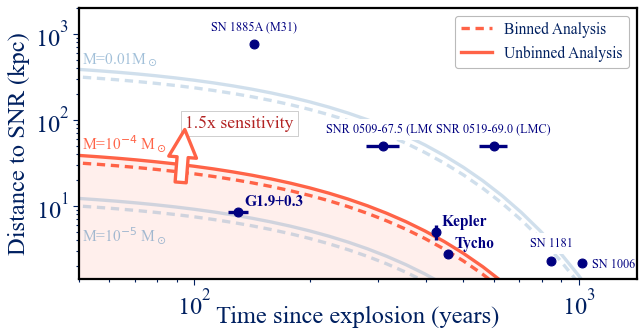

In [10]:
ts = np.logspace(1, 3.3, 47)
Fs = 5.0e-6 # 8.3e-6 * np.sqrt(2.1/6.5)
Fs1 = Fs/1.5
plt.figure(figsize=(9, 4.4))
# plt.figure(figsize=(11, 4))
ax = plt.gca()

dash_ls = (0,(2.5,1.7))
fade_alpha = 0.25
mec = 'navy'

c1 = 'steelblue'

c1 = 'steelblue'
# Ms = 1e-1
# ds = calc_d(Fs1, Ms, ts)
# plt.plot(ts, ds, c=c1, alpha=fade_alpha)#, label='>10$^{-2}$M$_\odot$')
# plt.text(ts[15]/1.1, ds[15]*1.24, f'M=0.1M$_\odot$', fontdict=dict(fontsize=14, color=c1, alpha=fade_alpha*2))

Ms = 1e-2
ds = calc_d(Fs, Ms, ts)
plt.plot(ts, ds, c=c1, ls=dash_ls, alpha=fade_alpha)
ds = calc_d(Fs1, Ms, ts)
plt.plot(ts, ds, c=c1, alpha=fade_alpha)#, label='>10$^{-2}$M$_\odot$')
plt.text(ts[15]/1.1, ds[15]*1.24, f'M=0.01M$_\odot$', fontdict=dict(fontsize=14, color=c1, alpha=fade_alpha*2))

# Ms = 1e-3
# ds = calc_d(Fs1, Ms, ts)
# plt.plot(ts, ds, c=c1, alpha=fade_alpha)#, label='>10$^{-2}$M$_\odot$')
# plt.text(ts[15]/1.1, ds[15]*1.24, f'M=10$^{{-3}}$ M$_\odot$', fontdict=dict(fontsize=14, color=c1, alpha=fade_alpha*2))

Ms = 1e-5
ds = calc_d(Fs, Ms, ts)
plt.plot(ts, ds, c=c1, ls=dash_ls, alpha=fade_alpha)
ds = calc_d(Fs1, Ms, ts)
plt.plot(ts, ds, c=c1, alpha=fade_alpha)#, label='>10$^{-2}$M$_\odot$')
plt.text(ts[15]/1.1, ds[15]/3, f'M=10$^{{-5}}$ M$_\odot$', fontdict=dict(fontsize=14, color=c1, alpha=fade_alpha*2))

c2 = 'tomato'
Ms = 1e-4
ds = calc_d(Fs, Ms, ts)
plt.plot(ts, ds, c=c2, ls=dash_ls, label='Binned Analysis')
ds = calc_d(Fs1, Ms, ts)
plt.plot(ts, ds, c=c2, label='Unbinned Analysis')#, label='>10$^{-4}$M$_\odot$')#$^{\mathrm{44}}$Ti
plt.text(ts[15]/1.1, ds[15]*1.24, f'M=10$^{{-4}}$ M$_\odot$', fontdict=dict(fontsize=14, color=c2, alpha=1))

# x_tail = 60
# y_tail = 110
# x_head = 60
# y_head = 25
# arrow = patches.FancyArrowPatch((x_tail, y_tail), (x_head, y_head),
#                                  facecolor='w',
#                                  edgecolor='r',
#                                  linewidth=3,
#                                  mutation_scale=50)
# ax.add_patch(arrow)

x_tail = 92
y_tail = 22 * 4/5
x_head = 94.5
y_head = 102 * 4/5
arrow = patches.FancyArrowPatch((x_tail, y_tail), (x_head, y_head),
                                 facecolor='w',
                                 edgecolor=c2,
                                 linewidth=3,
                                 mutation_scale=50,
                                 zorder=10)
ax.add_patch(arrow)
plt.text(x_head, y_head, '1.5x sensitivity',
         bbox=dict(facecolor=(1,1,1,1), edgecolor='darkgray', lw=0.5), 
         fontdict=dict(fontsize=16, color='firebrick')
         )

ts = np.logspace(1, 3, 401)
ds = calc_d(Fs1, Ms, ts)
for i in range(1, len(ts)):
    plt.fill_between([ts[i-1], ts[i]], 0, ds[i], facecolor=c2, alpha=0.1)

for i in range(3):
    plt.text(t[i]*1.04, d[i]*1.17, SNR[i], ha='left', weight='bold', fontdict=dict(fontsize=14, color=mec),
            #  bbox=dict(facecolor=colors.to_rgba('white')[:-1]+(0.0,),       # Truncated and re-appended alpha=0 for facecolor
            #            edgecolor='', linewidth=1.5)
                       )

for i in range(3,7):
    plt.text(t[i]*1, d[i]*1.45, SNR[i], ha='center', fontdict=dict(fontsize=11, color=mec),
             bbox=dict(facecolor='white', edgecolor='none'))
plt.text(t[-1]*1.06, d[-1]/1.15, SNR[-1], ha='left', fontdict=dict(fontsize=11, color=mec),
            # bbox=dict(facecolor='white', edgecolor='none')
            )

plt.errorbar(t, d, xerr=terr, yerr=derr, fmt='o',  
             markerfacecolor=mec, markersize=8, markeredgecolor=mec, ecolor='navy', capsize=0)

plt.xscale('log')
plt.yscale('log')
plt.xlabel('Time since explosion (years)')
ax.xaxis.set_label_coords(x=0.5, y=-0.1)
plt.ylabel('Distance to SNR (kpc)')
plt.xlim(left=50, right=1.414e3)
plt.ylim(bottom=1.414, top=2e3)
# ax.set_xticks([1e2, 3e2, 1e3])
# ax.set_xticklabels([100, 300, 1000])
ax.xaxis.set_tick_params(width=1, size=3, which='minor')
ax.yaxis.set_tick_params(width=1, size=3, which='minor')
ax.xaxis.set_tick_params(width=1, size=5, which='major')
ax.yaxis.set_tick_params(width=1, size=5, which='major')

plt.legend(loc='upper right', fontsize=14, edgecolor='darkgray')
plt.show()

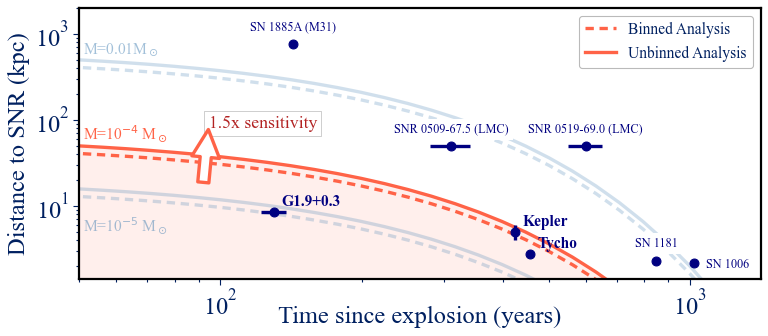

In [10]:
ts = np.logspace(1, 3.3, 47)
Fs = 3.0e-6 # 8.3e-6 * np.sqrt(2.1/6.5). Used 5.0e-6 for FINESST 2025.
Fs1 = Fs/1.5
plt.figure(figsize=(11, 4.4))
# plt.figure(figsize=(11, 4))
ax = plt.gca()

dash_ls = (0,(2.5,1.7))
fade_alpha = 0.25
mec = 'navy'

c1 = 'steelblue'

c1 = 'steelblue'
# Ms = 1e-1
# ds = calc_d(Fs1, Ms, ts)
# plt.plot(ts, ds, c=c1, alpha=fade_alpha)#, label='>10$^{-2}$M$_\odot$')
# plt.text(ts[15]/1.1, ds[15]*1.24, f'M=0.1M$_\odot$', fontdict=dict(fontsize=14, color=c1, alpha=fade_alpha*2))

Ms = 1e-2
ds = calc_d(Fs, Ms, ts)
plt.plot(ts, ds, c=c1, ls=dash_ls, alpha=fade_alpha)
ds = calc_d(Fs1, Ms, ts)
plt.plot(ts, ds, c=c1, alpha=fade_alpha)#, label='>10$^{-2}$M$_\odot$')
plt.text(ts[15]/1.1, ds[15]*1.24, f'M=0.01M$_\odot$', fontdict=dict(fontsize=14, color=c1, alpha=fade_alpha*2))

# Ms = 1e-3
# ds = calc_d(Fs1, Ms, ts)
# plt.plot(ts, ds, c=c1, alpha=fade_alpha)#, label='>10$^{-2}$M$_\odot$')
# plt.text(ts[15]/1.1, ds[15]*1.24, f'M=10$^{{-3}}$ M$_\odot$', fontdict=dict(fontsize=14, color=c1, alpha=fade_alpha*2))

Ms = 1e-5
ds = calc_d(Fs, Ms, ts)
plt.plot(ts, ds, c=c1, ls=dash_ls, alpha=fade_alpha)
ds = calc_d(Fs1, Ms, ts)
plt.plot(ts, ds, c=c1, alpha=fade_alpha)#, label='>10$^{-2}$M$_\odot$')
plt.text(ts[15]/1.1, ds[15]/3, f'M=10$^{{-5}}$ M$_\odot$', fontdict=dict(fontsize=14, color=c1, alpha=fade_alpha*2))

c2 = 'tomato'
Ms = 1e-4
ds = calc_d(Fs, Ms, ts)
plt.plot(ts, ds, c=c2, ls=dash_ls, label='Binned Analysis')
ds = calc_d(Fs1, Ms, ts)
plt.plot(ts, ds, c=c2, label='Unbinned Analysis')#, label='>10$^{-4}$M$_\odot$')#$^{\mathrm{44}}$Ti
plt.text(ts[15]/1.1, ds[15]*1.24, f'M=10$^{{-4}}$ M$_\odot$', fontdict=dict(fontsize=14, color=c2, alpha=1))

# x_tail = 60
# y_tail = 110
# x_head = 60
# y_head = 25
# arrow = patches.FancyArrowPatch((x_tail, y_tail), (x_head, y_head),
#                                  facecolor='w',
#                                  edgecolor='r',
#                                  linewidth=3,
#                                  mutation_scale=50)
# ax.add_patch(arrow)

x_tail = 92
y_tail = 22 * 4/5
x_head = 94.5
y_head = 102 * 4/5
arrow = patches.FancyArrowPatch((x_tail, y_tail), (x_head, y_head),
                                 facecolor='w',
                                 edgecolor=c2,
                                 linewidth=3,
                                 mutation_scale=50,
                                 zorder=10)
ax.add_patch(arrow)
plt.text(x_head, y_head, '1.5x sensitivity',
         bbox=dict(facecolor=(1,1,1,1), edgecolor='darkgray', lw=0.5), 
         fontdict=dict(fontsize=16, color='firebrick')
         )

ts = np.logspace(1, 3, 401)
ds = calc_d(Fs1, Ms, ts)
for i in range(1, len(ts)):
    plt.fill_between([ts[i-1], ts[i]], 0, ds[i], facecolor=c2, alpha=0.1)

for i in range(3):
    plt.text(t[i]*1.04, d[i]*1.17, SNR[i], ha='left', weight='bold', fontdict=dict(fontsize=14, color=mec),
            #  bbox=dict(facecolor=colors.to_rgba('white')[:-1]+(0.0,),       # Truncated and re-appended alpha=0 for facecolor
            #            edgecolor='', linewidth=1.5)
                       )

for i in range(3,7):
    plt.text(t[i]*1, d[i]*1.45, SNR[i], ha='center', fontdict=dict(fontsize=11, color=mec),
             bbox=dict(facecolor='white', edgecolor='none'))
plt.text(t[-1]*1.06, d[-1]/1.15, SNR[-1], ha='left', fontdict=dict(fontsize=11, color=mec),
            # bbox=dict(facecolor='white', edgecolor='none')
            )

plt.errorbar(t, d, xerr=terr, yerr=derr, fmt='o',  
             markerfacecolor=mec, markersize=8, markeredgecolor=mec, ecolor='navy', capsize=0)

plt.xscale('log')
plt.yscale('log')
plt.xlabel('Time since explosion (years)')
ax.xaxis.set_label_coords(x=0.5, y=-0.1)
plt.ylabel('Distance to SNR (kpc)')
plt.xlim(left=50, right=1.414e3)
plt.ylim(bottom=1.414, top=2e3)
# ax.set_xticks([1e2, 3e2, 1e3])
# ax.set_xticklabels([100, 300, 1000])
ax.xaxis.set_tick_params(width=1, size=3, which='minor')
ax.yaxis.set_tick_params(width=1, size=3, which='minor')
ax.xaxis.set_tick_params(width=1, size=5, which='major')
ax.yaxis.set_tick_params(width=1, size=5, which='major')

plt.legend(loc='upper right', fontsize=14, edgecolor='darkgray')
plt.show()

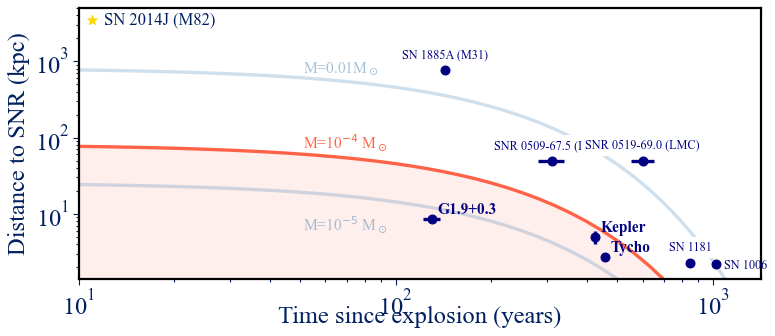

In [33]:
ts = np.logspace(1, 3.3, 47)
Fs = 2.0e-6 # 8.3e-6 * np.sqrt(2.1/6.5). Used 5.0e-6 for FINESST 2025.
Fs1 = Fs/1.5
plt.figure(figsize=(11, 4.4))
# plt.figure(figsize=(11, 4))
ax = plt.gca()

dash_ls = (0,(2.5,1.7))
fade_alpha = 0.25
mec = 'navy'

c1 = 'steelblue'

c1 = 'steelblue'
# Ms = 1e-1
# ds = calc_d(Fs1, Ms, ts)
# plt.plot(ts, ds, c=c1, alpha=fade_alpha)#, label='>10$^{-2}$M$_\odot$')
# plt.text(ts[15]/1.1, ds[15]*1.24, f'M=0.1M$_\odot$', fontdict=dict(fontsize=14, color=c1, alpha=fade_alpha*2))

Ms = 1e-2
ds = calc_d(Fs, Ms, ts)
# plt.plot(ts, ds, c=c1, ls=dash_ls, alpha=fade_alpha)
ds = calc_d(Fs1, Ms, ts)
plt.plot(ts, ds, c=c1, alpha=fade_alpha)#, label='>10$^{-2}$M$_\odot$')
plt.text(ts[15]/1.1, ds[15]*1.24, f'M=0.01M$_\odot$', fontdict=dict(fontsize=14, color=c1, alpha=fade_alpha*2))

# Ms = 1e-3
# ds = calc_d(Fs1, Ms, ts)
# plt.plot(ts, ds, c=c1, alpha=fade_alpha)#, label='>10$^{-2}$M$_\odot$')
# plt.text(ts[15]/1.1, ds[15]*1.24, f'M=10$^{{-3}}$ M$_\odot$', fontdict=dict(fontsize=14, color=c1, alpha=fade_alpha*2))

Ms = 1e-5
ds = calc_d(Fs, Ms, ts)
# plt.plot(ts, ds, c=c1, ls=dash_ls, alpha=fade_alpha)
ds = calc_d(Fs1, Ms, ts)
plt.plot(ts, ds, c=c1, alpha=fade_alpha)#, label='>10$^{-2}$M$_\odot$')
plt.text(ts[15]/1.1, ds[15]/3, f'M=10$^{{-5}}$ M$_\odot$', fontdict=dict(fontsize=14, color=c1, alpha=fade_alpha*2))

c2 = 'tomato'
Ms = 1e-4
ds = calc_d(Fs, Ms, ts)
# plt.plot(ts, ds, c=c2, ls=dash_ls, label='Binned Analysis')
ds = calc_d(Fs1, Ms, ts)
plt.plot(ts, ds, c=c2, label='Unbinned Analysis')#, label='>10$^{-4}$M$_\odot$')#$^{\mathrm{44}}$Ti
plt.text(ts[15]/1.1, ds[15]*1.24, f'M=10$^{{-4}}$ M$_\odot$', fontdict=dict(fontsize=14, color=c2, alpha=1))

# x_tail = 60
# y_tail = 110
# x_head = 60
# y_head = 25
# arrow = patches.FancyArrowPatch((x_tail, y_tail), (x_head, y_head),
#                                  facecolor='w',
#                                  edgecolor='r',
#                                  linewidth=3,
#                                  mutation_scale=50)
# ax.add_patch(arrow)

# x_tail = 92
# y_tail = 22 * 4/5
# x_head = 94.5
# y_head = 102 * 4/5
# arrow = patches.FancyArrowPatch((x_tail, y_tail), (x_head, y_head),
#                                  facecolor='w',
#                                  edgecolor=c2,
#                                  linewidth=3,
#                                  mutation_scale=50,
#                                  zorder=10)
# ax.add_patch(arrow)
# plt.text(x_head, y_head, '1.5x sensitivity',
#          bbox=dict(facecolor=(1,1,1,1), edgecolor='darkgray', lw=0.5), 
#          fontdict=dict(fontsize=16, color='firebrick')
#          )

ts = np.logspace(1, 3, 401)
ds = calc_d(Fs1, Ms, ts)
for i in range(1, len(ts)):
    plt.fill_between([ts[i-1], ts[i]], 0, ds[i], facecolor=c2, alpha=0.1)

for i in range(3):
    plt.text(t[i]*1.04, d[i]*1.17, SNR[i], ha='left', weight='bold', fontdict=dict(fontsize=14, color=mec),
            #  bbox=dict(facecolor=colors.to_rgba('white')[:-1]+(0.0,),       # Truncated and re-appended alpha=0 for facecolor
            #            edgecolor='', linewidth=1.5)
                       )

for i in range(3,7):
    plt.text(t[i]*1, d[i]*1.45, SNR[i], ha='center', fontdict=dict(fontsize=11, color=mec),
             bbox=dict(facecolor='white', edgecolor='none'))
plt.text(t[-1]*1.06, d[-1]/1.15, SNR[-1], ha='left', fontdict=dict(fontsize=11, color=mec),
            # bbox=dict(facecolor='white', edgecolor='none')
            )

plt.errorbar(t, d, xerr=terr, yerr=derr, fmt='o',  
             markerfacecolor=mec, markersize=8, markeredgecolor=mec, ecolor='navy', capsize=0)

plt.xscale('log')
plt.yscale('log')
plt.xlabel('Time since explosion (years)')
ax.xaxis.set_label_coords(x=0.5, y=-0.1)
plt.ylabel('Distance to SNR (kpc)')
plt.xlim(left=10, right=1.414e3)
plt.scatter(11, 3.5e3, s=80, marker='*', c='gold')
plt.text(12, 3.5e3, 'SN 2014J (M82)', ha='left', va='center', fontdict={'fontsize': 15})
plt.ylim(bottom=1.414, top=5e3)
# ax.set_xticks([1e2, 3e2, 1e3])
# ax.set_xticklabels([100, 300, 1000])
ax.xaxis.set_tick_params(width=1, size=3, which='minor')
ax.yaxis.set_tick_params(width=1, size=3, which='minor')
ax.xaxis.set_tick_params(width=1, size=5, which='major')
ax.yaxis.set_tick_params(width=1, size=5, which='major')

# plt.legend(loc='upper right', fontsize=14, edgecolor='darkgray')
plt.show()

In [7]:
SNR = np.array(['G1.9+0.3', 'Kepler', 'Tycho', 'SN 1181', 'SN 1885A (M31)',
                'SNR 0509-67.5 (LMC)', 'SNR 0519-69.0 (LMC)', 'SN 1006', 
                'SN 1987A', 'Cas A', 'Vela Jr.', 'W49B', 'Crab',
                'G21.5-0.9', 
                ])
M = np.ones(len(SNR)) * 1e-4
d = np.array([8.5, 5.0, 2.75, 2.3, 766, 49, 50, 2.18,
              51.5, 3, 1, 10, 1.93, 4.7, 
              ])
derr = np.array([0,1,0.25,0.14,60, 3, 5, 0.1,
                 1,0,0.5,2, 0, 0.4
                 ])
t = 2028 - np.array([1898, 1604, 1572, 1181, 1885, 1718, 1428, 1006,
                     1987, 1681, 1271, 1000, 1054, 1140
                     ])
terr = np.array([8,0,0,0,0,30,50,0,
                 0,14,100, 50, 0, 200, 
                 ])

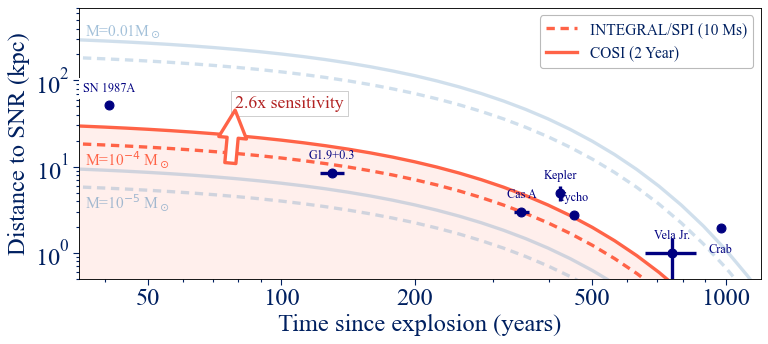

In [ ]:
ts = np.logspace(1, 3.3, 47)
Fs = 6.7e-6*2.6         # 6.7e-6 is two-year COSI estimate for 5000 km/s broadening
Fs1 = Fs/2.6
plt.figure(figsize=(11, 4.4))
# plt.figure(figsize=(11, 4))
ax = plt.gca()

dash_ls = (0,(2.5,1.7))
fade_alpha = 0.25
mec = 'navy'

c1 = 'steelblue'

c1 = 'steelblue'

Ms = 1e-2
ds = calc_d(Fs, Ms, ts)
plt.plot(ts, ds, c=c1, ls=dash_ls, alpha=fade_alpha)
ds = calc_d(Fs1, Ms, ts)
plt.plot(ts, ds, c=c1, alpha=fade_alpha)#, label='>10$^{-2}$M$_\odot$')
plt.text(ts[12]/1.1, ds[15]*1.3, f'M=0.01M$_\odot$', fontdict=dict(fontsize=14, color=c1, alpha=fade_alpha*2))

Ms = 1e-5
ds = calc_d(Fs, Ms, ts)
plt.plot(ts, ds, c=c1, ls=dash_ls, alpha=fade_alpha)
ds = calc_d(Fs1, Ms, ts)
plt.plot(ts, ds, c=c1, alpha=fade_alpha)#, label='>10$^{-2}$M$_\odot$')
plt.text(ts[12]/1.1, ds[15]/2.5, f'M=10$^{{-5}}$ M$_\odot$', fontdict=dict(fontsize=14, color=c1, alpha=fade_alpha*2))

c2 = 'tomato'
Ms = 1e-4
ds = calc_d(Fs, Ms, ts)
plt.plot(ts, ds, c=c2, ls=dash_ls, label='INTEGRAL/SPI (10 Ms)')
ds = calc_d(Fs1, Ms, ts)
plt.plot(ts, ds, c=c2, label='COSI (2 Year)')#, label='>10$^{-4}$M$_\odot$')#$^{\mathrm{44}}$Ti
plt.text(ts[12]/1.1, ds[15]/2.5, f'M=10$^{{-4}}$ M$_\odot$', fontdict=dict(fontsize=14, color=c2, alpha=1))

x_tail = 92/1.2
y_tail = 22/1.7 * 4/5
x_head = 94.5/1.2
y_head = 102/1.7 * 4/5
arrow = patches.FancyArrowPatch((x_tail, y_tail), (x_head, y_head),
                                 facecolor='w',
                                 edgecolor=c2,
                                 linewidth=3,
                                 mutation_scale=50,
                                 zorder=10)
ax.add_patch(arrow)
plt.text(x_head, y_head, '2.6x sensitivity',
         bbox=dict(facecolor=(1,1,1,1), edgecolor='darkgray', lw=0.5), 
         fontdict=dict(fontsize=16, color='firebrick')
         )

ts = np.logspace(1, 3, 401)
ds = calc_d(Fs1, Ms, ts)
for i in range(1, len(ts)):
    plt.fill_between([ts[i-1], ts[i]], 0, ds[i], facecolor=c2, alpha=0.1)

for i in range(len(SNR)-1):
    if (d[i] > 48) or (t[i] > 800):
        plt.text(t[i]*1, d[i]*1.45, SNR[i], ha='center', fontdict=dict(fontsize=11, color=mec),
                bbox=dict(facecolor='white', edgecolor='none')
                )
    else:
        plt.text(t[i]*1, d[i]*1.45, SNR[i], ha='center', fontdict=dict(fontsize=11, color=mec),
                # bbox=dict(facecolor='white', edgecolor='none')
                )
plt.text(t[-1]*1, d[-1]/1.9, SNR[-1], ha='center', fontdict=dict(fontsize=11, color=mec),
            # bbox=dict(facecolor='white', edgecolor='none')
            )

plt.errorbar(t, d, xerr=terr, yerr=derr, fmt='o',  
             markerfacecolor=mec, markersize=8, markeredgecolor=mec, ecolor='navy', capsize=0)

plt.xscale('log')
plt.yscale('log')
plt.xlabel('Time since explosion (years)')
ax.xaxis.set_label_coords(x=0.5, y=-0.13)
plt.ylabel('Distance to SNR (kpc)')
plt.xlim(left=35, right=1.414e3)
plt.ylim(bottom=0.5, top=2e3)
ax.set_xticks([50, 1e2, 2e2, 5e2, 1e3])
ax.set_xticklabels([50, 100, 200, 500, 1000])
ax.xaxis.set_tick_params(width=1, size=3, which='minor')
ax.yaxis.set_tick_params(width=1, size=3, which='minor')
ax.xaxis.set_tick_params(width=1, size=5, which='major')
ax.yaxis.set_tick_params(width=1, size=5, which='major')

plt.legend(loc='upper right', fontsize=14, edgecolor='darkgray')
plt.show()

In [21]:
SNR = np.array(['G1.9+0.3', 'Kepler', 'Tycho' ,
                'SN 1987A', 'Cas A', 'Vela Jr.', 'Crab',
                ])
M = np.ones(len(SNR)) * 1e-4
d = np.array([8.5, 5.0, 2.75,
              51.5, 3, 1, 1.93, 
              ])
derr = np.array([0,1,0.25,
                 1,0,0.5,0, 
                 ])
t = 2028 - np.array([1898, 1604, 1572, 
                     1987, 1681, 1271, 1054,
                     ])
terr = np.array([8,0,0,
                 0,14,100, 0, 
                 ])

In [20]:
F(1e-4, 9, 150)

1.8989226637706022e-05

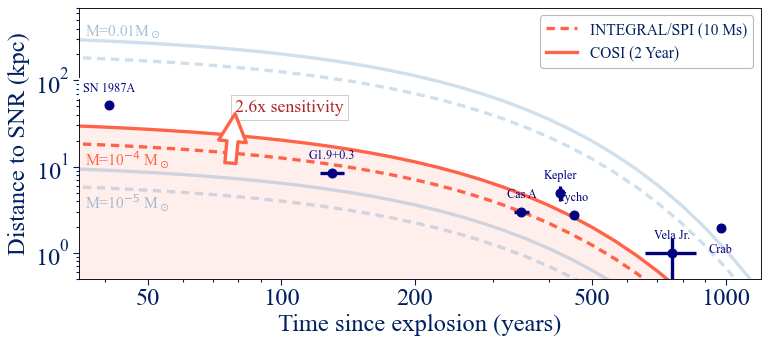

In [29]:
ts = np.logspace(1, 3.3, 47)
Fs = 6.7e-6*2.6         # 6.7e-6 is two-year COSI estimate for 5000 km/s broadening
Fs1 = Fs/2.6
plt.figure(figsize=(11, 4.4))
# plt.figure(figsize=(11, 4))
ax = plt.gca()

dash_ls = (0,(2.5,1.7))
fade_alpha = 0.25
mec = 'navy'

c1 = 'steelblue'

c1 = 'steelblue'

Ms = 1e-2
ds = calc_d(Fs, Ms, ts)
plt.plot(ts, ds, c=c1, ls=dash_ls, alpha=fade_alpha)
ds = calc_d(Fs1, Ms, ts)
plt.plot(ts, ds, c=c1, alpha=fade_alpha)#, label='>10$^{-2}$M$_\odot$')
plt.text(ts[12]/1.1, ds[15]*1.3, f'M=0.01M$_\odot$', fontdict=dict(fontsize=14, color=c1, alpha=fade_alpha*2))

Ms = 1e-5
ds = calc_d(Fs, Ms, ts)
plt.plot(ts, ds, c=c1, ls=dash_ls, alpha=fade_alpha)
ds = calc_d(Fs1, Ms, ts)
plt.plot(ts, ds, c=c1, alpha=fade_alpha)#, label='>10$^{-2}$M$_\odot$')
plt.text(ts[12]/1.1, ds[15]/2.5, f'M=10$^{{-5}}$ M$_\odot$', fontdict=dict(fontsize=14, color=c1, alpha=fade_alpha*2))

c2 = 'tomato'
Ms = 1e-4
ds = calc_d(Fs, Ms, ts)
plt.plot(ts, ds, c=c2, ls=dash_ls, label='INTEGRAL/SPI (10 Ms)')
ds = calc_d(Fs1, Ms, ts)
plt.plot(ts, ds, c=c2, label='COSI (2 Year)')#, label='>10$^{-4}$M$_\odot$')#$^{\mathrm{44}}$Ti
plt.text(ts[12]/1.1, ds[15]/2.5, f'M=10$^{{-4}}$ M$_\odot$', fontdict=dict(fontsize=14, color=c2, alpha=1))

x_tail = 92/1.2
y_tail = 22/1.7 * 4/5
x_head = 94.5/1.2
y_head = 102/1.7/1.1 * 4/5
arrow = patches.FancyArrowPatch((x_tail, y_tail), (x_head, y_head),
                                 facecolor='w',
                                 edgecolor=c2,
                                 linewidth=3,
                                 mutation_scale=50,
                                 zorder=10)
ax.add_patch(arrow)
plt.text(x_head, y_head, '2.6x sensitivity',
         bbox=dict(facecolor=(1,1,1,1), edgecolor='darkgray', lw=0.5), 
         fontdict=dict(fontsize=16, color='firebrick')
         )

ts = np.logspace(1, 3, 401)
ds = calc_d(Fs1, Ms, ts)
for i in range(1, len(ts)):
    plt.fill_between([ts[i-1], ts[i]], 0, ds[i], facecolor=c2, alpha=0.1)

for i in range(len(SNR)-1):
    if (d[i] > 48) or (t[i] > 800):
        plt.text(t[i]*1, d[i]*1.45, SNR[i], ha='center', fontdict=dict(fontsize=11, color=mec),
                bbox=dict(facecolor='white', edgecolor='none')
                )
    else:
        plt.text(t[i]*1, d[i]*1.45, SNR[i], ha='center', fontdict=dict(fontsize=11, color=mec),
                # bbox=dict(facecolor='white', edgecolor='none')
                )
plt.text(t[-1]*1, d[-1]/1.9, SNR[-1], ha='center', fontdict=dict(fontsize=11, color=mec),
            # bbox=dict(facecolor='white', edgecolor='none')
            )

plt.errorbar(t, d, xerr=terr, yerr=derr, fmt='o',  
             markerfacecolor=mec, markersize=8, markeredgecolor=mec, ecolor='navy', capsize=0)

plt.xscale('log')
plt.yscale('log')
plt.xlabel('Time since explosion (years)')
ax.xaxis.set_label_coords(x=0.5, y=-0.13)
plt.ylabel('Distance to SNR (kpc)')
plt.xlim(left=35, right=1.2e3)
plt.ylim(bottom=0.5, top=0.7e3)
ax.set_xticks([50, 1e2, 2e2, 5e2, 1e3])
ax.set_xticklabels([50, 100, 200, 500, 1000])
ax.xaxis.set_tick_params(width=1, size=3, which='minor')
ax.yaxis.set_tick_params(width=1, size=3, which='minor')
ax.xaxis.set_tick_params(width=1, size=5, which='major')
ax.yaxis.set_tick_params(width=1, size=5, which='major')

plt.legend(loc='upper right', fontsize=14, edgecolor='darkgray')
plt.show()

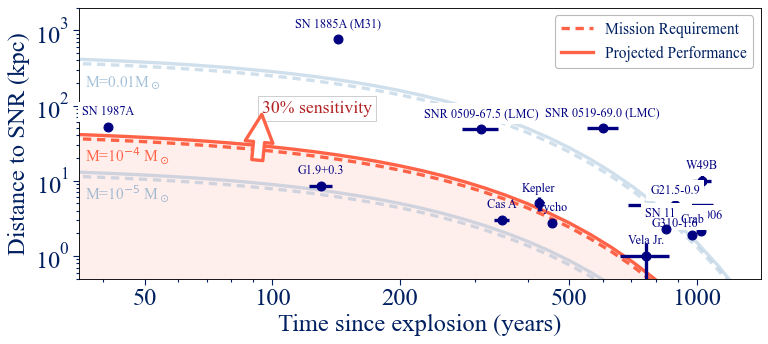

In [8]:
ts = np.logspace(1, 3.3, 47)
Fs = 4.5e-6
Fs1 = Fs/1.3
plt.figure(figsize=(11, 4.4))
# plt.figure(figsize=(11, 4))
ax = plt.gca()

dash_ls = (0,(2.5,1.7))
fade_alpha = 0.25
mec = 'navy'

c1 = 'steelblue'

c1 = 'steelblue'

Ms = 1e-2
ds = calc_d(Fs, Ms, ts)
plt.plot(ts, ds, c=c1, ls=dash_ls, alpha=fade_alpha)
ds = calc_d(Fs1, Ms, ts)
plt.plot(ts, ds, c=c1, alpha=fade_alpha)#, label='>10$^{-2}$M$_\odot$')
plt.text(ts[12]/1.1, ds[15]/2, f'M=0.01M$_\odot$', fontdict=dict(fontsize=14, color=c1, alpha=fade_alpha*2))

Ms = 1e-5
ds = calc_d(Fs, Ms, ts)
plt.plot(ts, ds, c=c1, ls=dash_ls, alpha=fade_alpha)
ds = calc_d(Fs1, Ms, ts)
plt.plot(ts, ds, c=c1, alpha=fade_alpha)#, label='>10$^{-2}$M$_\odot$')
plt.text(ts[12]/1.1, ds[15]/2., f'M=10$^{{-5}}$ M$_\odot$', fontdict=dict(fontsize=14, color=c1, alpha=fade_alpha*2))

c2 = 'tomato'
Ms = 1e-4
ds = calc_d(Fs, Ms, ts)
plt.plot(ts, ds, c=c2, ls=dash_ls, label='Mission Requirement')
ds = calc_d(Fs1, Ms, ts)
plt.plot(ts, ds, c=c2, label='Projected Performance')#, label='>10$^{-4}$M$_\odot$')#$^{\mathrm{44}}$Ti
plt.text(ts[12]/1.1, ds[15]/2., f'M=10$^{{-4}}$ M$_\odot$', fontdict=dict(fontsize=14, color=c2, alpha=1))

x_tail = 92
y_tail = 22 * 4/5
x_head = 94.5
y_head = 102 * 4/5
arrow = patches.FancyArrowPatch((x_tail, y_tail), (x_head, y_head),
                                 facecolor='w',
                                 edgecolor=c2,
                                 linewidth=3,
                                 mutation_scale=50,
                                 zorder=10)
ax.add_patch(arrow)
plt.text(x_head, y_head, '30% sensitivity',
         bbox=dict(facecolor=(1,1,1,1), edgecolor='darkgray', lw=0.5), 
         fontdict=dict(fontsize=16, color='firebrick')
         )

ts = np.logspace(1, 3, 401)
ds = calc_d(Fs1, Ms, ts)
for i in range(1, len(ts)):
    plt.fill_between([ts[i-1], ts[i]], 0, ds[i], facecolor=c2, alpha=0.1)

for i in range(len(SNR)-1):
    if (d[i] > 48) or (t[i] > 800):
        plt.text(t[i]*1, d[i]*1.45, SNR[i], ha='center', fontdict=dict(fontsize=11, color=mec),
                bbox=dict(facecolor='white', edgecolor='none')
                )
    else:
        plt.text(t[i]*1, d[i]*1.45, SNR[i], ha='center', fontdict=dict(fontsize=11, color=mec),
                # bbox=dict(facecolor='white', edgecolor='none')
                )
plt.text(t[-1]*1, d[-1]/1.9, SNR[-1], ha='center', fontdict=dict(fontsize=11, color=mec),
            # bbox=dict(facecolor='white', edgecolor='none')
            )

plt.errorbar(t, d, xerr=terr, yerr=derr, fmt='o',  
             markerfacecolor=mec, markersize=8, markeredgecolor=mec, ecolor='navy', capsize=0)

plt.xscale('log')
plt.yscale('log')
plt.xlabel('Time since explosion (years)')
ax.xaxis.set_label_coords(x=0.5, y=-0.13)
plt.ylabel('Distance to SNR (kpc)')
plt.xlim(left=35, right=1.414e3)
plt.ylim(bottom=0.5, top=2e3)
ax.set_xticks([50, 1e2, 2e2, 5e2, 1e3])
ax.set_xticklabels([50, 100, 200, 500, 1000])
ax.xaxis.set_tick_params(width=1, size=3, which='minor')
ax.yaxis.set_tick_params(width=1, size=3, which='minor')
ax.xaxis.set_tick_params(width=1, size=5, which='major')
ax.yaxis.set_tick_params(width=1, size=5, which='major')

plt.legend(loc='upper right', fontsize=14, edgecolor='darkgray')
plt.show()

### Measurement Uncertainties

In [23]:
strip_pitch = 0.1   # cm
CTD_depth_resolution = 0.02     # cm

delta_x = delta_y = strip_pitch/2
delta_z = CTD_depth_resolution
delta_r = np.sqrt(delta_x**2 + delta_y**2 + delta_z**2)

In [52]:
delta_r

0.07348469228349536

In [137]:
def delta_Psi(x, y, z, delta_z, delta_r):
    r = np.sqrt(x**2 + y**2 + z**2)
    a = delta_z**2 
    b = (delta_r * z / r)**2 
    c = (a+b) / (x**2 + y**2)
    # return np.sqrt(c)

    r, delta_r = temp(x, y, z)
    l = (x * z * delta_x)**2
    m = (y * z * delta_y)**2
    n = ((x**2 + y**2) * delta_z)**2
    return np.sqrt((l + m + n) / (r**2 + np.sqrt(x**2 + y**2)**2))

def delta_Chi(x, y, delta_x, delta_y):
    a = (x * delta_y)**2 + (y * delta_x)**2
    b = a / (x**2 + y**2)**2
    return np.sqrt(b)

In [146]:
print(np.rad2deg(delta_Psi(1, 1, 1, delta_z, delta_r)))
print(np.rad2deg(delta_Chi(1, 1, delta_x, delta_y)))

2.081659045572906
2.0257117113534893


In [148]:
def delta_Chi(x,y,z,delta_x,delta_y,delta_z):
    r = np.sqrt(x**2 + y**2 + z**2)
    a = delta_x**2 * (y**2 + z**2)
    b = delta_y**2 * (x**2 + z**2)
    c = delta_z**2 * (y**2 + x**2)
    return np.sqrt(a+b+c)/r**2

In [10]:
import numpy as np

def calculate_uncertainties(x1, y1, z1, x2, y2, z2, delta_x, delta_y, delta_z):
    # Differences
    dx = x2 - x1
    dy = y2 - y1
    dz = z2 - z1

    # Distances
    r = np.sqrt(dx**2 + dy**2 + dz**2)
    r_xy = np.sqrt(dx**2 + dy**2)

    # Angles
    psi = np.arccos(dz / r)
    chi = np.arctan2(dy, dx)

    # Uncertainties
    delta_r = np.sqrt((dx * delta_x)**2 + (dy * delta_y)**2 + (dz * delta_z)**2) / r
    delta_r_xy = np.sqrt((dx * delta_x)**2 + (dy * delta_y)**2) / r_xy

    delta_psi = np.sqrt((dz**2 * delta_r**2 + r**2 * delta_z**2) / (r**2 * (1 - (dz / r)**2))**2)
    delta_chi = np.sqrt((dy**2 * delta_x**2 + dx**2 * delta_y**2) / r_xy**4)

    return psi, delta_psi, chi, delta_chi

# Example usage
x1, y1, z1 = 1.0, 1.0, 1.0
x2, y2, z2 = 2.5, 2.5, 2.5
delta_x, delta_y, delta_z = 0.01, 0.01, 0.01

psi, delta_psi, chi, delta_chi = calculate_uncertainties(x1, y1, z1, x2, y2, z2, delta_x, delta_y, delta_z)
print(f"psi: {np.rad2deg(psi)}, delta_psi: {np.rad2deg(delta_psi)}")
print(f"chi: {np.rad2deg(chi)}, delta_chi: {np.rad2deg(delta_chi)}")

psi: 54.735610317245346, delta_psi: 0.3819718634205488
chi: 45.0, delta_chi: 0.2700948948471319


In [163]:
np.sqrt(3*s2/0.61)/np.sqrt(6)

1.0766575335584252

In [160]:
np.sqrt(0.4**2+0.46**2)

0.6095900261651268

In [149]:
np.rad2deg(delta_Chi(2,2,2, delta_x/5, delta_y/5, delta_z))

0.3307973372530753

In [27]:
np.sqrt(0.25**2 + 0.29**2)

0.38288379438153297

### Clumping Metric

In [1]:
from mpl_toolkits.mplot3d import Axes3D

#### Old

In [49]:
# --- Sphere geometry (parametric grid) ---
u = np.linspace(0, 2 * np.pi, 100)
v = np.linspace(0, np.pi, 100)

r = 1
x = r * np.outer(np.cos(u), np.sin(v))
y = r * np.outer(np.sin(u), np.sin(v))
z = r * np.outer(np.ones_like(u), np.cos(v))

# --- Colormap rotation around x-axis ---
theta_deg = 135
theta = np.radians(theta_deg)

# Apply rotation
y_rot = y * np.cos(theta) - z * np.sin(theta)
z_rot = y * np.sin(theta) + z * np.cos(theta)

# Normalize rotated z for colormap
cmap_values = (z_rot - z_rot.min()) / (z_rot.max() - z_rot.min())

In [67]:
# --- Function to draw a thick 3D arrow (cylinder + cone) ---
def draw_3d_arrow(ax, start, direction, length=0.6, radius=0.05, color='k'):
    # Normalize direction
    direction = direction / np.linalg.norm(direction)
    
    # Shaft (cylinder)
    shaft_length = 0.75 * length
    tip_length = 0.25 * length

    # Cylinder parameterization
    t = np.linspace(0, shaft_length, 20)
    theta = np.linspace(0, 2*np.pi, 20)
    t, theta = np.meshgrid(t, theta)

    # Local cylinder coordinates
    xc = radius * np.cos(theta)
    yc = radius * np.sin(theta)
    zc = t

    # Build rotation matrix to align cylinder with direction vector
    z_axis = np.array([0, 0, 1])
    v = np.cross(z_axis, direction)
    c = np.dot(z_axis, direction)
    if np.linalg.norm(v) < 1e-8:
        R = np.eye(3)
    else:
        vx = np.array([[0, -v[2], v[1]],
                       [v[2], 0, -v[0]],
                       [-v[1], v[0], 0]])
        R = np.eye(3) + vx + vx @ vx * (1 / (1 + c))

    # Rotate and translate cylinder
    xyz = np.stack([xc, yc, zc], axis=-1)
    xyz_rot = xyz @ R.T + start

    ax.plot_surface(
        xyz_rot[...,0], xyz_rot[...,1], xyz_rot[...,2],
        color=color, shade=True
    )

    # Cone tip
    t2 = np.linspace(0, tip_length, 20)
    theta2 = np.linspace(0, 2*np.pi, 20)
    t2, theta2 = np.meshgrid(t2, theta2)

    rc = radius * (1 - t2 / tip_length)
    xc2 = rc * np.cos(theta2)
    yc2 = rc * np.sin(theta2)
    zc2 = t2 + shaft_length

    xyz2 = np.stack([xc2, yc2, zc2], axis=-1)
    xyz2_rot = xyz2 @ R.T + start

    ax.plot_surface(
        xyz2_rot[...,0], xyz2_rot[...,1], xyz2_rot[...,2],
        color=color, shade=True
    )


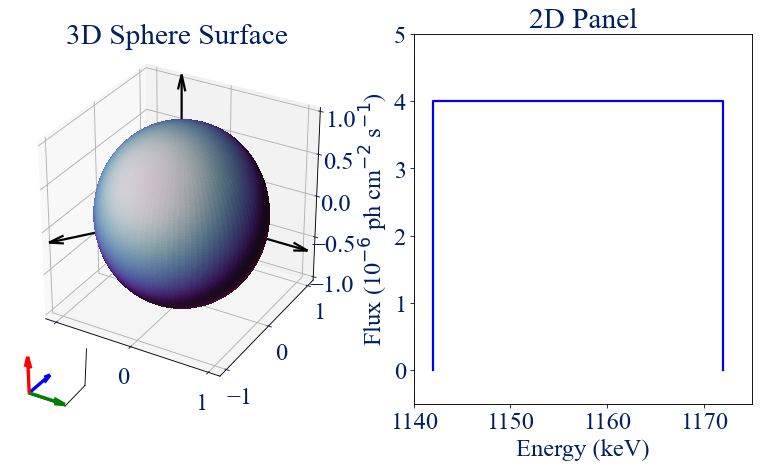

In [77]:
# --- Figure with two equal-sized panels ---
fig = plt.figure(figsize=(12, 6))

# Left: 3D sphere panel
ax = fig.add_subplot(1, 2, 1, projection='3d')

# --- Render sphere with rotated colormap ---
ax.plot_surface(
    x, y, z,
    facecolors=plt.cm.twilight(cmap_values),
    rstride=1, cstride=1,
    linewidth=0, antialiased=False
)

ax.set_box_aspect([1, 1, 1])
ax.set_title("3D Sphere Surface")

# --- Arrows from sphere surface toward +z, -x, -y ---

arrow_length = 0.6   # length of arrows
sphere_radius = 1.0  # same as r

# 1. Arrow toward +z (start at north pole)
start_z = np.array([0, 0, sphere_radius])
ax.quiver(
    start_z[0], start_z[1], start_z[2],
    0, 0, arrow_length,
    color='k', linewidth=2
)

# 2. Arrow toward -x (start at +x surface)
start_x = np.array([sphere_radius, 0, 0])
ax.quiver(
    start_x[0], start_x[1], start_x[2],
    arrow_length, 0, 0,
    color='k', linewidth=2
)

# 3. Arrow toward -y (start at +y surface)
start_y = np.array([-sphere_radius*0.6, -sphere_radius*0.8, 0])
ax.quiver(
    start_y[0], start_y[1], start_y[2],
    -arrow_length*0.6, -arrow_length*0.8, 0,
    color='k', linewidth=2
)


# --- Right-side 2D panel ---
# Right: 2D panel
ax2 = fig.add_subplot(1, 2, 2)
ax2.set_title("2D Panel")
ax2.plot([1142, 1142, 1172, 1172], [0, 4, 4, 0], linewidth=2)
ax2.set_xlabel("Energy (keV)")
ax2.set_ylabel("Flux (10$^{-6}$ ph cm$^{-2}$ s$^{-1}$)")
ax2.set_xlim([1140, 1175])
ax2.set_ylim([-0.5, 5])

# --- Inset orientation triad (bottom-left of figure) ---
ax_inset = fig.add_axes([0.1, 0.1, 0.15, 0.15], projection='3d')

L = 1.0
ax_inset.quiver(0, 0, 0, L, 0, 0, color='g')  # X axis
ax_inset.quiver(0, 0, 0, 0, L, 0, color='b')  # Y axis
ax_inset.quiver(0, 0, 0, 0, 0, L, color='r')  # Z axis

# Clean inset appearance
ax_inset.xaxis.pane.set_visible(False)
ax_inset.yaxis.pane.set_visible(False)
ax_inset.zaxis.pane.set_visible(False)
ax_inset.grid(False)

ax_inset.set_xlim([0, L])
ax_inset.set_ylim([0, L])
ax_inset.set_zlim([0, L])
ax_inset.set_xticks([])
ax_inset.set_yticks([])
ax_inset.set_zticks([])
ax_inset.set_box_aspect([1, 1, 1])
ax_inset.set_facecolor("white")

plt.show()

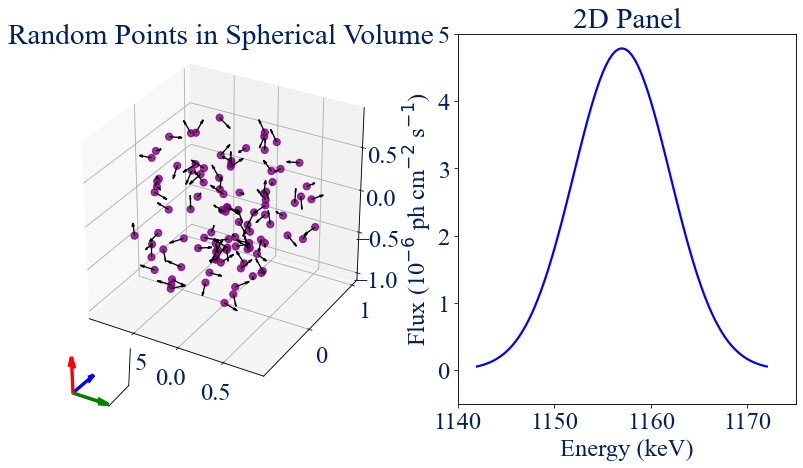

In [ ]:
# --- Left panel: 3D random points inside a sphere ---
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(1, 2, 1, projection='3d')
ax.set_title("Random Points in Spherical Volume")
ax.set_box_aspect([1, 1, 1])

# Number of points
N = 100
r = 1.0

# Uniform random distribution inside a sphere:
# radius must be cubic-rooted for uniform volume density
rand_r = r * np.cbrt(np.random.rand(N))
theta = 2 * np.pi * np.random.rand(N)
phi = np.arccos(2 * np.random.rand(N) - 1)

# Convert spherical → Cartesian
x_pts = rand_r * np.sin(phi) * np.cos(theta)
y_pts = rand_r * np.sin(phi) * np.sin(theta)
z_pts = rand_r * np.cos(phi)

# Plot the points
ax.scatter(x_pts, y_pts, z_pts, s=40, c='purple', alpha=0.8)

# --- Add short random-direction arrows from each point ---

arrow_length = 0.15  # short arrows so they don't clutter

# Generate random directions for each point
rand_dirs = np.random.normal(size=(N, 3))
rand_dirs /= np.linalg.norm(rand_dirs, axis=1)[:, None]  # normalize each vector

# Plot arrows
ax.quiver(
    x_pts, y_pts, z_pts,               # starting points
    rand_dirs[:,0], rand_dirs[:,1], rand_dirs[:,2],   # directions
    length=arrow_length,
    normalize=True,
    color='black',
    linewidth=1.2
)


# --- Right-side 2D panel ---
# Right: 2D panel
ax2 = fig.add_subplot(1, 2, 2)
ax2.set_title("2D Panel")
x1 = np.linspace(1142, 1172, 91)
ax2.plot(x1, gaussian(x1, 60, 1157, 5), linewidth=2)
ax2.set_xlabel("Energy (keV)")
ax2.set_ylabel("Flux (10$^{-6}$ ph cm$^{-2}$ s$^{-1}$)")
ax2.set_xlim([1140, 1175])
ax2.set_ylim([-0.5, 5])

# --- Inset orientation triad (bottom-left of figure) ---
ax_inset = fig.add_axes([0.1, 0.1, 0.15, 0.15], projection='3d')

L = 1.0
ax_inset.quiver(0, 0, 0, L, 0, 0, color='g')  # X axis
ax_inset.quiver(0, 0, 0, 0, L, 0, color='b')  # Y axis
ax_inset.quiver(0, 0, 0, 0, 0, L, color='r')  # Z axis

# Clean inset appearance
ax_inset.xaxis.pane.set_visible(False)
ax_inset.yaxis.pane.set_visible(False)
ax_inset.zaxis.pane.set_visible(False)
ax_inset.grid(False)

ax_inset.set_xlim([0, L])
ax_inset.set_ylim([0, L])
ax_inset.set_zlim([0, L])
ax_inset.set_xticks([])
ax_inset.set_yticks([])
ax_inset.set_zticks([])
ax_inset.set_box_aspect([1, 1, 1])
ax_inset.set_facecolor("white")

plt.show()

3D plot of radial velocity vectors on a sphere saved as 'sphere_radial_velocity_vectors.png'


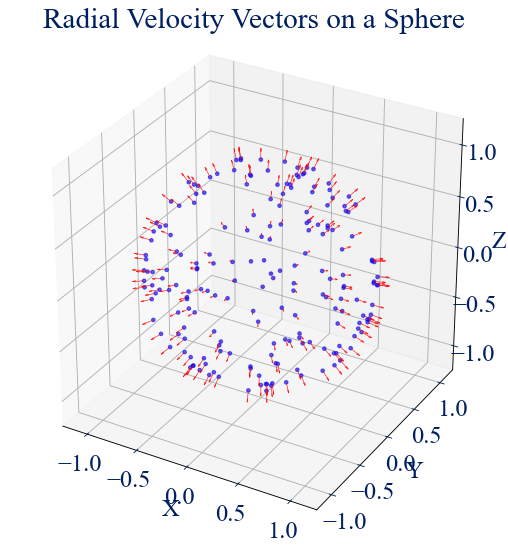

In [91]:
# Creating 3D plot of a sphere with radial velocity vectors
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Step 1: Generate N random points on the sphere
N = 200
phi = np.random.uniform(0, 2 * np.pi, N)  # azimuthal angle
cos_theta = np.random.uniform(-1, 1, N)   # cosine of polar angle
theta = np.arccos(cos_theta)

# Step 2: Convert spherical to Cartesian coordinates
x = np.sin(theta) * np.cos(phi)
y = np.sin(theta) * np.sin(phi)
z = np.cos(theta)

# Step 3: Define velocity vectors (radial, normalized)
v = 1.0
vx = v * x
vy = v * y
vz = v * z

# Step 4-7: Create 3D plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.set_box_aspect([1,1,1])

# Plot points
ax.scatter(x, y, z, color='blue', s=10, alpha=0.6, label='Surface Points')

# Plot velocity vectors
ax.quiver(x, y, z, vx, vy, vz, length=0.1, normalize=True, color='red', linewidth=0.5)

# Label axes
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Radial Velocity Vectors on a Sphere')

# Set equal aspect ratio
ax.set_xlim([-1.2, 1.2])
ax.set_ylim([-1.2, 1.2])
ax.set_zlim([-1.2, 1.2])

# Save figure
# output_path = "/mnt/data/sphere_radial_velocity_vectors.png"
# plt.savefig(output_path, dpi=300)
# plt.close()

print("3D plot of radial velocity vectors on a sphere saved as 'sphere_radial_velocity_vectors.png'")


3D plot of dipole-weighted velocity vectors saved as 'dipole_weighted_velocity_sphere.png'


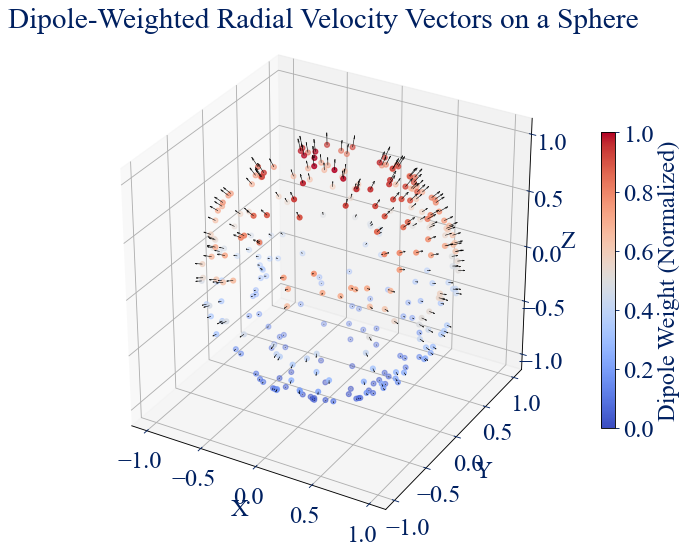

In [90]:
# Generating 3D plot of sphere with dipole-weighted velocity arrows
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Step 1: Generate N random points on the sphere
N = 300
phi = np.random.uniform(0, 2 * np.pi, N)
cos_theta = np.random.uniform(-1, 1, N)
theta = np.arccos(cos_theta)

# Step 2: Convert spherical to Cartesian coordinates
x = np.sin(theta) * np.cos(phi)
y = np.sin(theta) * np.sin(phi)
z = np.cos(theta)

# Step 3: Dipole axis along z-axis, so dipole weight is cos(theta) = z
w = z.copy()

# Step 4: Normalize weights to [0, 1]
w_min, w_max = w.min(), w.max()
w_norm = (w - w_min) / (w_max - w_min)

# Step 5: Define velocity vectors scaled by dipole weight
v = 1.0  # base speed
vx = v * x * w_norm
vy = v * y * w_norm
vz = v * z * w_norm

# Step 6-9: Create 3D plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.set_title("Dipole-Weighted Radial Velocity Vectors on a Sphere")

# Scatter plot colored by dipole weight
sc = ax.scatter(x, y, z, c=w_norm, cmap='coolwarm', s=20)

# Quiver plot for velocity vectors
ax.quiver(x, y, z, vx, vy, vz, length=0.1, normalize=False, color='black', linewidth=0.5)

# Set equal aspect ratio
ax.set_box_aspect([1,1,1])
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

# Add colorbar
cbar = plt.colorbar(sc, ax=ax, shrink=0.6)
cbar.set_label('Dipole Weight (Normalized)')

# Save the figure
# output_path = "/mnt/data/dipole_weighted_velocity_sphere.png"
# plt.savefig(output_path, dpi=300, bbox_inches='tight')
# plt.close()

print("3D plot of dipole-weighted velocity vectors saved as 'dipole_weighted_velocity_sphere.png'")


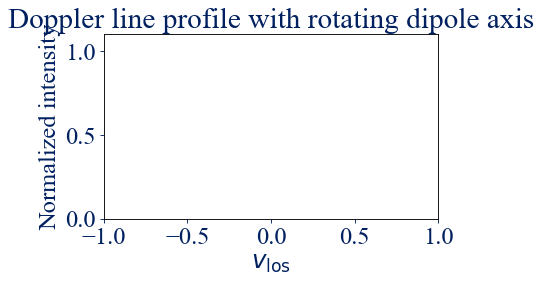

In [94]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# -----------------------------
# Parameters
# -----------------------------
N = 800          # number of points on the sphere
v0 = 1.0         # radial speed (sets max |v_los|)
nbins = 40       # number of velocity bins
nframes = 120    # number of animation frames

# -----------------------------
# Generate random points on a sphere
# -----------------------------
# Uniform on sphere: phi uniform in [0, 2pi), cos(theta) uniform in [-1, 1]
phi = 2 * np.pi * np.random.rand(N)
mu = 2 * np.random.rand(N) - 1  # cos(theta)
theta = np.arccos(mu)

# Cartesian coordinates (unit vectors r_hat)
x = np.sqrt(1 - mu**2) * np.cos(phi)
y = np.sqrt(1 - mu**2) * np.sin(phi)
z = mu
r_hat = np.vstack((x, y, z)).T  # shape (N, 3)

# Line-of-sight direction: along +z
los = np.array([0.0, 0.0, 1.0])

# Line-of-sight velocities (for pure radial expansion)
v_los = v0 * (r_hat @ los)  # v0 * cos(theta_los)

# Velocity bin edges
vmin, vmax = -v0, v0
bins = np.linspace(vmin, vmax, nbins + 1)
bin_centers = 0.5 * (bins[:-1] + bins[1:])

# -----------------------------
# Dipole axis rotation
# -----------------------------
def dipole_axis(phi_rot):
    """
    Dipole axis rotated by angle phi_rot around the y-axis.
    Start with axis along +z: (0, 0, 1).
    """
    # Rotation matrix around y-axis
    c = np.cos(phi_rot)
    s = np.sin(phi_rot)
    R = np.array([[ c, 0,  s],
                  [ 0, 1,  0],
                  [-s, 0,  c]])
    return R @ np.array([0.0, 0.0, 1.0])

# -----------------------------
# Set up figure
# -----------------------------
fig, ax = plt.subplots(figsize=(6, 4))
line, = ax.plot([], [], lw=2)

ax.set_xlim(vmin, vmax)
ax.set_ylim(0, 1.1)  # will rescale with normalization
ax.set_xlabel(r"$v_{\rm los}$")
ax.set_ylabel("Normalized intensity")
ax.set_title("Doppler line profile with rotating dipole axis")

# -----------------------------
# Animation update function
# -----------------------------
def init():
    line.set_data([], [])
    return line,

def update(frame):
    # Angle of dipole axis for this frame
    phi_rot = 2 * np.pi * frame / nframes
    d_axis = dipole_axis(phi_rot)

    # Dipole weight: w = r_hat · d_axis
    w = r_hat @ d_axis

    # Optional: keep only positive part (e.g., emissivity ∝ max(w, 0))
    # Comment/uncomment depending on your physical model
    # w_eff = np.maximum(w, 0.0)
    # For a pure dipole (allowing negative weights), use:
    w_eff = w

    # Weighted histogram of v_los
    hist, _ = np.histogram(v_los, bins=bins, weights=w_eff)

    # Normalize profile for visualization
    if np.max(np.abs(hist)) > 0:
        hist_norm = hist / np.max(np.abs(hist))
    else:
        hist_norm = hist

    line.set_data(bin_centers, hist_norm)
    ax.set_title(
        "Doppler line profile\nDipole axis rotation angle = "
        f"{np.degrees(phi_rot):.1f}°"
    )
    return line,

anim = FuncAnimation(
    fig, update, frames=nframes, init_func=init,
    blit=True, interval=80, repeat=True
)

plt.tight_layout()
plt.show()

# If you want to save as MP4 (requires ffmpeg installed), uncomment:
anim.save("doppler_dipole_rotation.gif", writer="pillow", fps=30)


Created 3D plot of quadrupole-weighted velocity vectors and saved as 'quadrupole_velocity_plot.png'


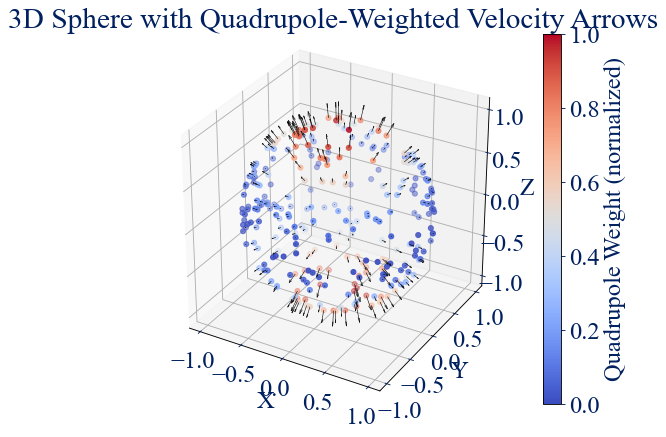

In [ ]:
# Generating 3D plot with velocity arrows scaled by quadrupole weighting
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Generate random points on a sphere
N = 300
phi = 2 * np.pi * np.random.rand(N)
mu = 2 * np.random.rand(N) - 1  # cos(theta)
theta = np.arccos(mu)

x = np.sqrt(1 - mu**2) * np.cos(phi)
y = np.sqrt(1 - mu**2) * np.sin(phi)
z = mu
r_hat = np.vstack((x, y, z)).T

# Quadrupole weighting: Y20 proportional to (3 cos^2(theta) - 1)
w = 3 * mu**2 - 1
w_norm = (w - w.min()) / (w.max() - w.min())  # normalize to [0,1]

# Velocity vectors scaled by quadrupole weight
vectors = r_hat * w_norm[:, None]

# Plot
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Scatter points colored by quadrupole weight
sc = ax.scatter(x, y, z, c=w_norm, cmap='coolwarm', s=20)

# Quiver arrows
ax.quiver(x, y, z, vectors[:,0], vectors[:,1], vectors[:,2], length=0.2, normalize=False, color='black', linewidth=0.5)

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('3D Sphere with Quadrupole-Weighted Velocity Arrows')
ax.set_box_aspect([1,1,1])
plt.colorbar(sc, label='Quadrupole Weight (normalized)')

# Save the plot
# output_path = "/mnt/data/quadrupole_velocity_plot.png"
# plt.savefig(output_path, dpi=300, bbox_inches='tight')
# plt.close()

print("Created 3D plot of quadrupole-weighted velocity vectors and saved as 'quadrupole_velocity_plot.png'")


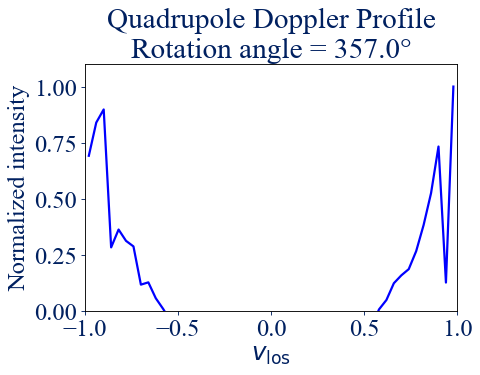

In [97]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# -----------------------------
# Parameters
# -----------------------------
N = 800          # number of points on the sphere
v0 = 1.0         # radial speed (sets max |v_los|)
nbins = 50       # number of velocity bins
nframes = 120    # number of animation frames

# -----------------------------
# Generate random points on a sphere
# -----------------------------
phi = 2 * np.pi * np.random.rand(N)
mu = 2 * np.random.rand(N) - 1  # cos(theta)
theta = np.arccos(mu)

x = np.sqrt(1 - mu**2) * np.cos(phi)
y = np.sqrt(1 - mu**2) * np.sin(phi)
z = mu
r_hat = np.vstack((x, y, z)).T  # shape (N, 3)

# Line-of-sight direction: +z
los = np.array([0.0, 0.0, 1.0])

# Line-of-sight velocities
v_los = v0 * (r_hat @ los)

# Velocity bins
vmin, vmax = -v0, v0
bins = np.linspace(vmin, vmax, nbins + 1)
bin_centers = 0.5 * (bins[:-1] + bins[1:])

# -----------------------------
# Quadrupole axis rotation
# -----------------------------
def quadrupole_axis(phi_rot):
    """Rotate quadrupole axis around y-axis by phi_rot."""
    c = np.cos(phi_rot)
    s = np.sin(phi_rot)
    R = np.array([[ c, 0,  s],
                  [ 0, 1,  0],
                  [-s, 0,  c]])
    return R @ np.array([0.0, 0.0, 1.0])

# -----------------------------
# Set up figure
# -----------------------------
fig, ax = plt.subplots(figsize=(6, 4))
line, = ax.plot([], [], lw=2)

ax.set_xlim(vmin, vmax)
ax.set_ylim(0, 1.1)
ax.set_xlabel(r"$v_{\rm los}$")
ax.set_ylabel("Normalized intensity")
ax.set_title("Quadrupole-weighted Doppler line profile")

# -----------------------------
# Animation update
# -----------------------------
def init():
    line.set_data([], [])
    return line,

def update(frame):
    phi_rot = 2 * np.pi * frame / nframes
    q_axis = quadrupole_axis(phi_rot)

    # Quadrupole weight: w = 3 (r·axis)^2 - 1
    dot = r_hat @ q_axis
    w = 3 * dot**2 - 1

    # Weighted histogram
    hist, _ = np.histogram(v_los, bins=bins, weights=w)

    # Normalize
    if np.max(np.abs(hist)) > 0:
        hist_norm = hist / np.max(np.abs(hist))
    else:
        hist_norm = hist

    line.set_data(bin_centers, hist_norm)
    ax.set_title(
        f"Quadrupole Doppler Profile\nRotation angle = {np.degrees(phi_rot):.1f}°"
    )
    return line,

anim = FuncAnimation(
    fig, update, frames=nframes, init_func=init,
    blit=True, interval=80, repeat=True
)

# plt.close()  # Prevent duplicate static image
# HTML(anim.to_jshtml())
anim.save("doppler_quadrupole_rotation.gif", writer="pillow", fps=30)

#### New

https://copilot.microsoft.com/chats/sWJT36YKrZ3UgzhH1CPaP

/var/folders/5w/bxqs6l5j65vfrl397w9mj1kc0000gn/T/ipykernel_27046/2073168494.py:115: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from current font.
  anim.save("crazy.gif", writer="pillow", fps=10)
/Users/penguin/miniconda3/envs/cosipy/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from current font.
  func(*args, **kwargs)
/Users/penguin/miniconda3/envs/cosipy/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


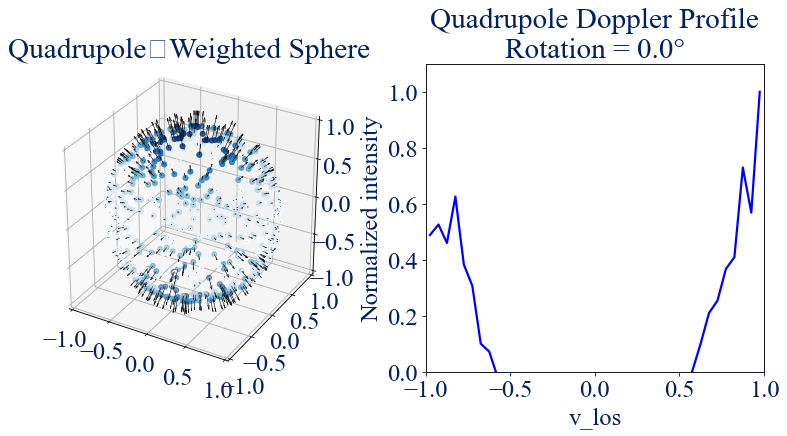

In [99]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import HTML

# -----------------------------
# Parameters
# -----------------------------
N = 600
v0 = 1.0
nbins = 40
nframes = 120

# -----------------------------
# Generate random points on a sphere
# -----------------------------
phi = 2 * np.pi * np.random.rand(N)
mu = 2 * np.random.rand(N) - 1
theta = np.arccos(mu)

x = np.sqrt(1 - mu**2) * np.cos(phi)
y = np.sqrt(1 - mu**2) * np.sin(phi)
z = mu
r_hat = np.vstack((x, y, z)).T

# LOS direction
los = np.array([0, 0, 1])
v_los = v0 * (r_hat @ los)

# Histogram bins
bins = np.linspace(-v0, v0, nbins + 1)
bin_centers = 0.5 * (bins[:-1] + bins[1:])

# -----------------------------
# Quadrupole axis rotation
# -----------------------------
def quadrupole_axis(phi_rot):
    c, s = np.cos(phi_rot), np.sin(phi_rot)
    R = np.array([[ c, 0,  s],
                  [ 0, 1,  0],
                  [-s, 0,  c]])
    return R @ np.array([0, 0, 1])

# -----------------------------
# Figure setup
# -----------------------------
fig = plt.figure(figsize=(12, 5))

ax_sphere = fig.add_subplot(121, projection='3d')
ax_profile = fig.add_subplot(122)

# Sphere scatter (updated each frame)
scatter = ax_sphere.scatter([], [], [], c=[], cmap="Blues", s=20)

# Quiver placeholder
quiver = None

# Line profile
line, = ax_profile.plot([], [], lw=2)

ax_sphere.set_title("Quadrupole‑Weighted Sphere")
ax_sphere.set_box_aspect([1,1,1])
ax_sphere.set_xlim([-1,1])
ax_sphere.set_ylim([-1,1])
ax_sphere.set_zlim([-1,1])

ax_profile.set_xlim([-v0, v0])
ax_profile.set_ylim([0, 1.1])
ax_profile.set_xlabel("v_los")
ax_profile.set_ylabel("Normalized intensity")

# -----------------------------
# Animation update
# -----------------------------
def update(frame):
    global quiver

    phi_rot = 2 * np.pi * frame / nframes
    q_axis = quadrupole_axis(phi_rot)

    # Quadrupole weight
    dot = r_hat @ q_axis
    w = 3 * dot**2 - 1
    w_norm = (w - w.min()) / (w.max() - w.min())

    # Update sphere scatter
    scatter._offsets3d = (x, y, z)
    scatter.set_array(w_norm)

    # Update quiver
    if quiver:
        quiver.remove()

    vectors = r_hat * w_norm[:, None]
    quiver = ax_sphere.quiver(
        x, y, z,
        vectors[:,0], vectors[:,1], vectors[:,2],
        length=0.2, normalize=False, color="black", linewidth=0.5
    )

    # Doppler profile
    hist, _ = np.histogram(v_los, bins=bins, weights=w)
    hist_norm = hist / np.max(np.abs(hist)) if np.max(np.abs(hist)) > 0 else hist

    line.set_data(bin_centers, hist_norm)
    ax_profile.set_title(f"Quadrupole Doppler Profile\nRotation = {np.degrees(phi_rot):.1f}°")

    return scatter, quiver, line

anim = FuncAnimation(fig, update, frames=nframes, interval=80, blit=False)

# plt.close()
# HTML(anim.to_jshtml())
anim.save("crazy.gif", writer="pillow", fps=10)

/var/folders/5w/bxqs6l5j65vfrl397w9mj1kc0000gn/T/ipykernel_36929/618110812.py:58: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(12, 5))


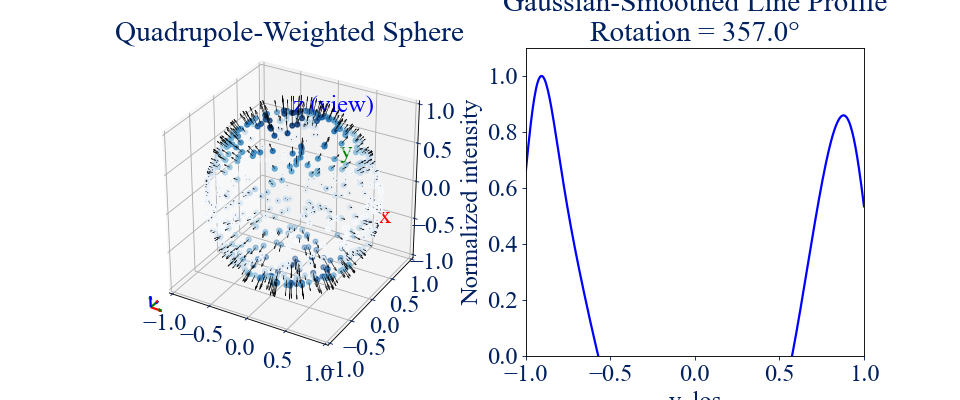

In [29]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import HTML

# -----------------------------
# Parameters
# -----------------------------
N = 600
v0 = 1.0
nframes = 120
sigma = 0.08   # Gaussian width in velocity units
nv = 400       # resolution of velocity grid

# Velocity grid for smoothed profile
v_grid = np.linspace(-v0, v0, nv)

# -----------------------------
# Generate random points on a sphere
# -----------------------------
phi = 2 * np.pi * np.random.rand(N)
mu = 2 * np.random.rand(N) - 1
theta = np.arccos(mu)

x = np.sqrt(1 - mu**2) * np.cos(phi)
y = np.sqrt(1 - mu**2) * np.sin(phi)
z = mu
r_hat = np.vstack((x, y, z)).T

# Line-of-sight direction
los = np.array([0, 0, 1])
v_los = v0 * (r_hat @ los)

# -----------------------------
# Quadrupole axis rotation
# -----------------------------
def quadrupole_axis(phi_rot):
    c, s = np.cos(phi_rot), np.sin(phi_rot)
    R = np.array([[ c, 0,  s],
                  [ 0, 1,  0],
                  [-s, 0,  c]])
    return R @ np.array([0, 0, 1])

# -----------------------------
# Gaussian smoothing per point
# -----------------------------
def smooth_profile(v_los, weights):
    # Each point contributes a Gaussian
    diff = v_grid[:, None] - v_los[None, :]
    kernel = np.exp(-0.5 * (diff / sigma)**2)
    profile = kernel @ weights
    return profile / np.max(profile)

# -----------------------------
# Figure setup
# -----------------------------
fig = plt.figure(figsize=(12, 5))

ax_sphere = fig.add_subplot(121, projection='3d')
ax_profile = fig.add_subplot(122)

# Sphere scatter
scatter = ax_sphere.scatter([], [], [], c=[], cmap="Blues", s=20)

# Velocity arrows
quiver = None

# Orientation triad at bottom-left
triad_origin = np.array([-1.2, -1.2, -1.2])
triad_dirs = np.array([[0.5, 0, 0], [0, 0.5, 0], [0, 0, 0.5]])
triad_colors = ["red", "green", "blue"]
triad = ax_sphere.quiver(
    triad_origin[0], triad_origin[1], triad_origin[2],
    triad_dirs[:,0], triad_dirs[:,1], triad_dirs[:,2],
    length=0.3, normalize=False, colors=triad_colors, linewidth=2
)

ax_sphere.text(1.1, 0, 0, "x", color="red")
ax_sphere.text(0, 1.1, 0, "y", color="green")
ax_sphere.text(0, 0, 1.1, "z (view)", color="blue")

# Line profile
line, = ax_profile.plot([], [], lw=2)

ax_sphere.set_title("Quadrupole-Weighted Sphere")
ax_sphere.set_box_aspect([1,1,1])
ax_sphere.set_xlim([-1,1])
ax_sphere.set_ylim([-1,1])
ax_sphere.set_zlim([-1,1])

ax_profile.set_xlim([-v0, v0])
ax_profile.set_ylim([0, 1.1])
ax_profile.set_xlabel("v_los")
ax_profile.set_ylabel("Normalized intensity")

# -----------------------------
# Animation update
# -----------------------------
def update(frame):
    global quiver

    phi_rot = 2 * np.pi * frame / nframes
    q_axis = quadrupole_axis(phi_rot)

    # Quadrupole weight
    dot = r_hat @ q_axis
    w = 3 * dot**2 - 1
    w_norm = (w - w.min()) / (w.max() - w.min())

    # Update sphere scatter
    scatter._offsets3d = (x, y, z)
    scatter.set_array(w_norm)

    # Update velocity arrows
    if quiver:
        quiver.remove()

    vectors = r_hat * w_norm[:, None]
    quiver = ax_sphere.quiver(
        x, y, z,
        vectors[:,0], vectors[:,1], vectors[:,2],
        length=0.2, normalize=False, color="black", linewidth=0.5
    )

    # Smoothed Doppler profile
    profile = smooth_profile(v_los, w)

    line.set_data(v_grid, profile)
    ax_profile.set_title(
        f"Gaussian-Smoothed Line Profile\nRotation = {np.degrees(phi_rot):.1f}°"
    )

    return scatter, quiver, line, triad

anim = FuncAnimation(fig, update, frames=nframes, interval=80, blit=False)

# plt.close()
# HTML(anim.to_jshtml())
anim.save("crazy.gif", writer="pillow", fps=10)

In [28]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import HTML

# -----------------------------
# Parameters
# -----------------------------
N = 600          # number of surface points
v0 = 1.0         # radial speed
nframes = 120    # animation frames
sigma = 0.08     # Gaussian width in velocity units
nv = 400         # velocity grid resolution

# Multipole coefficients (you can tweak these)
A0 = 1.0   # monopole
A1 = 0.7   # dipole amplitude
A2 = 0.5   # quadrupole amplitude

# Velocity grid for smoothed profile
v_grid = np.linspace(-v0, v0, nv)

# -----------------------------
# Generate random points on a sphere
# -----------------------------
phi = 2 * np.pi * np.random.rand(N)
mu = 2 * np.random.rand(N) - 1
theta = np.arccos(mu)

x = np.sqrt(1 - mu**2) * np.cos(phi)
y = np.sqrt(1 - mu**2) * np.sin(phi)
z = mu
r_hat = np.vstack((x, y, z)).T

# Line-of-sight direction: +z (default canvas orientation)
los = np.array([0, 0, 1])
v_los = v0 * (r_hat @ los)

# -----------------------------
# Multipole axis rotation (around y)
# -----------------------------
def multipole_axis(phi_rot):
    c, s = np.cos(phi_rot), np.sin(phi_rot)
    R = np.array([[ c, 0,  s],
                  [ 0, 1,  0],
                  [-s, 0,  c]])
    return R @ np.array([0, 0, 1])

# -----------------------------
# Gaussian smoothing per point
# -----------------------------
def smooth_profile(v_los, weights):
    diff = v_grid[:, None] - v_los[None, :]
    kernel = np.exp(-0.5 * (diff / sigma)**2)
    profile = kernel @ weights
    if np.max(profile) > 0:
        profile /= np.max(profile)
    return profile

# -----------------------------
# Figure setup
# -----------------------------
fig = plt.figure(figsize=(12, 5))
ax_sphere = fig.add_subplot(121, projection='3d')
ax_profile = fig.add_subplot(122)

# Sphere scatter
scatter = ax_sphere.scatter([], [], [], c=[], cmap="Blues", s=20)
quiver = None

# Orientation triad (bottom-left, default canvas axes)
triad_origin = np.array([-1.3, -1.3, -1.3])
triad_dirs = np.array([[0.4, 0,   0  ],   # +x
                       [0,   0.4, 0  ],   # +y
                       [0,   0,   0.4]])  # +z
triad_colors = ["red", "green", "blue"]
triad = ax_sphere.quiver(
    triad_origin[0], triad_origin[1], triad_origin[2],
    triad_dirs[:,0], triad_dirs[:,1], triad_dirs[:,2],
    length=0.4, normalize=False, colors=triad_colors, linewidth=2
)
# ax_sphere.text(-1.3+0.45, -1.3,      -1.3,      "x",      color="red")
# ax_sphere.text(-1.3,      -1.3+0.45, -1.3,      "y",      color="green")
# ax_sphere.text(0, 0, 1.1, "z (view)", color="blue")

# Line profile
line, = ax_profile.plot([], [], lw=2)

ax_sphere.set_title("l=0 to l=2 Sphere")
ax_sphere.set_xlim([-1.5, 1.5])
ax_sphere.set_ylim([-1.5, 1.5])
ax_sphere.set_zlim([-1.5, 1.5])
ax_sphere.set_box_aspect([1, 1, 1])

ax_profile.set_xlim([-v0, v0])
ax_profile.set_ylim([0, 1.1])
ax_profile.set_xlabel("v_los", y=0)
ax_profile.set_ylabel("Normalized intensity")

# -----------------------------
# Animation update
# -----------------------------
def update(frame):
    global quiver

    phi_rot = 2 * np.pi * frame / nframes
    axis = multipole_axis(phi_rot)

    # Project r_hat onto multipole axis
    dot = r_hat @ axis

    # Monopole + dipole + quadrupole weighting
    w_mono = A0 * np.ones_like(dot)
    w_dip  = A1 * dot
    w_quad = A2 * (3 * dot**2 - 1)
    w = w_mono + w_dip + w_quad

    # For coloring, normalize to [0,1]
    w_norm = (w - w.min()) / (w.max() - w.min())

    # Update sphere scatter
    scatter._offsets3d = (x, y, z)
    scatter.set_array(w_norm)

    # Update velocity arrows
    if quiver:
        quiver.remove()
    vectors = r_hat * w_norm[:, None]
    quiver = ax_sphere.quiver(
        x, y, z,
        vectors[:,0], vectors[:,1], vectors[:,2],
        length=0.2, normalize=False, color="black", linewidth=0.5
    )

    # Smoothed Doppler profile
    profile = smooth_profile(v_los, w)
    line.set_data(v_grid, profile)
    ax_profile.set_title(
        "Gaussian-Smoothed Line Profile"
    )

    return scatter, quiver, line, triad

anim = FuncAnimation(fig, update, frames=nframes, interval=80, blit=False)

plt.close()
HTML(anim.to_jshtml())


/var/folders/5w/bxqs6l5j65vfrl397w9mj1kc0000gn/T/ipykernel_36929/618320463.py:64: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(12, 5))


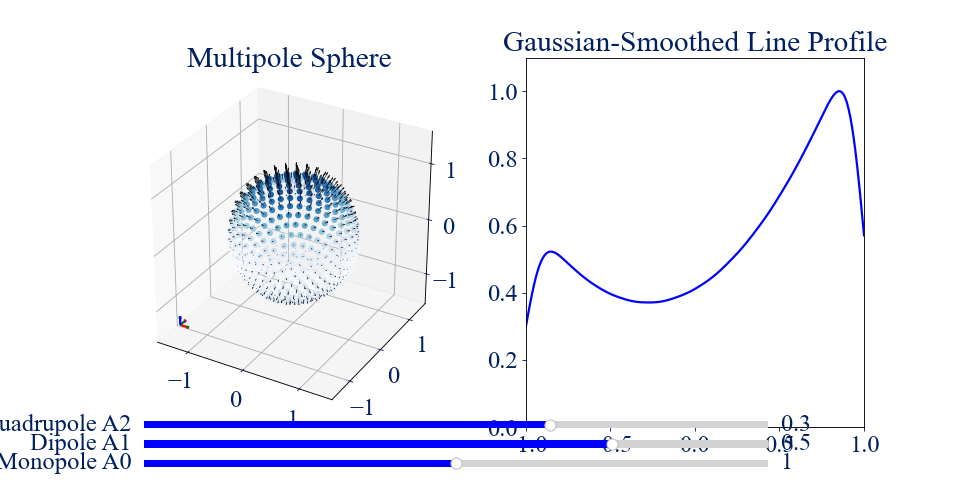

In [ ]:
%matplotlib widget

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.widgets import Slider
from mpl_toolkits.mplot3d import Axes3D

# -----------------------------
# Parameters
# -----------------------------
N = 600
v0 = 1.0
sigma = 0.08
nv = 400
v_grid = np.linspace(-v0, v0, nv)

# -----------------------------
# Generate random points on a sphere
# -----------------------------
phi = 2 * np.pi * np.random.rand(N)
mu = 2 * np.random.rand(N) - 1
theta = np.arccos(mu)

# x = np.sqrt(1 - mu**2) * np.cos(phi)
# y = np.sqrt(1 - mu**2) * np.sin(phi)
# z = mu
# r_hat = np.vstack((x, y, z)).T

def fibonacci_sphere(N):
    i = np.arange(N)
    phi = np.pi * (3. - np.sqrt(5.))  # golden angle
    y = 1 - 2*(i+0.5)/N
    r = np.sqrt(1 - y*y)
    theta = phi * i
    x = r * np.cos(theta)
    z = r * np.sin(theta)
    return np.vstack((x, y, z)).T

r_hat = fibonacci_sphere(N)
x, y, z = r_hat[:,0], r_hat[:,1], r_hat[:,2]

# LOS direction = +z
los = np.array([0, 0, 1])
v_los = v0 * (r_hat @ los)

# -----------------------------
# Gaussian smoothing per point
# -----------------------------
def smooth_profile(v_los, weights):
    diff = v_grid[:, None] - v_los[None, :]
    kernel = np.exp(-0.5 * (diff / sigma)**2)
    profile = kernel @ weights
    if np.max(profile) > 0:
        profile /= np.max(profile)
    return profile

# -----------------------------
# Multipole weighting
# -----------------------------
def compute_weights(A0, A1, A2):
    # Axis fixed along +z for GUI version
    axis = np.array([0, 0, 1])
    dot = r_hat @ axis

    w_mono = A0 * np.ones_like(dot)
    w_dip  = A1 * dot
    w_quad = A2 * (3 * dot**2 - 1)

    return w_mono + w_dip + w_quad

# -----------------------------
# Figure layout
# -----------------------------
fig = plt.figure(figsize=(12, 6))

ax_sphere = fig.add_subplot(121, projection='3d')
ax_profile = fig.add_subplot(122)

# Initial multipole strengths
A0_init, A1_init, A2_init = 1.0, 0.5, 0.3

# Initial weights
w = compute_weights(A0_init, A1_init, A2_init)
w_norm = (w - w.min()) / (w.max() - w.min())

# Sphere scatter
scatter = ax_sphere.scatter(x, y, z, c=w_norm, cmap="Blues", s=20)

# Velocity arrows
vectors = r_hat * w_norm[:, None]
quiver = ax_sphere.quiver(
    x, y, z,
    vectors[:,0], vectors[:,1], vectors[:,2],
    length=0.2, normalize=False, color="black", linewidth=0.5
)

# Orientation triad
triad_origin = np.array([-1.3, -1.3, -1.3])
triad_dirs = np.array([[0.4, 0, 0], [0, 0.4, 0], [0, 0, 0.4]])
triad_colors = ["red", "green", "blue"]
triad = ax_sphere.quiver(
    triad_origin[0], triad_origin[1], triad_origin[2],
    triad_dirs[:,0], triad_dirs[:,1], triad_dirs[:,2],
    length=0.4, normalize=False, colors=triad_colors, linewidth=2
)

# ax_sphere.text(-1.3+0.45, -1.3, -1.3, "x", color="red")
# ax_sphere.text(-1.3, -1.3+0.45, -1.3, "y", color="green")
# ax_sphere.text(-1.3, -1.3, -1.3+0.45, "z(view)", color="blue")

ax_sphere.set_xlim([-1.5, 1.5])
ax_sphere.set_ylim([-1.5, 1.5])
ax_sphere.set_zlim([-1.5, 1.5])
ax_sphere.set_box_aspect([1,1,1])
ax_sphere.set_title("Multipole Sphere")

# Initial line profile
profile = smooth_profile(v_los, w)
line, = ax_profile.plot(v_grid, profile, lw=2)
ax_profile.set_ylim([0, 1.1])
ax_profile.set_xlim([-v0, v0])
ax_profile.set_title("Gaussian-Smoothed Line Profile")

# -----------------------------
# Slider setup
# -----------------------------
axcolor = 'lightgoldenrodyellow'
ax_A0 = plt.axes([0.15, 0.02, 0.65, 0.03], facecolor=axcolor)
ax_A1 = plt.axes([0.15, 0.06, 0.65, 0.03], facecolor=axcolor)
ax_A2 = plt.axes([0.15, 0.10, 0.65, 0.03], facecolor=axcolor)

sA0 = Slider(ax_A0, 'Monopole A0', 0.0, 2.0, valinit=A0_init)
sA1 = Slider(ax_A1, 'Dipole A1', -1.0, 1.0, valinit=A1_init)
sA2 = Slider(ax_A2, 'Quadrupole A2', -1.0, 1.0, valinit=A2_init)

# -----------------------------
# Update function
# -----------------------------
def update(val):
    global quiver

    A0, A1, A2 = sA0.val, sA1.val, sA2.val
    w = compute_weights(A0, A1, A2)
    w_norm = (w - w.min()) / (w.max() - w.min())

    # Update sphere colors
    scatter.set_array(w_norm)

    # Update velocity arrows
    quiver.remove()
    vectors = r_hat * w_norm[:, None]
    quiver = ax_sphere.quiver(
        x, y, z,
        vectors[:,0], vectors[:,1], vectors[:,2],
        length=0.2, normalize=False, color="black", linewidth=0.5
    )

    # Update line profile
    profile = smooth_profile(v_los, w)
    line.set_ydata(profile)

    fig.canvas.draw_idle()

sA0.on_changed(update)
sA1.on_changed(update)
sA2.on_changed(update)

plt.show()

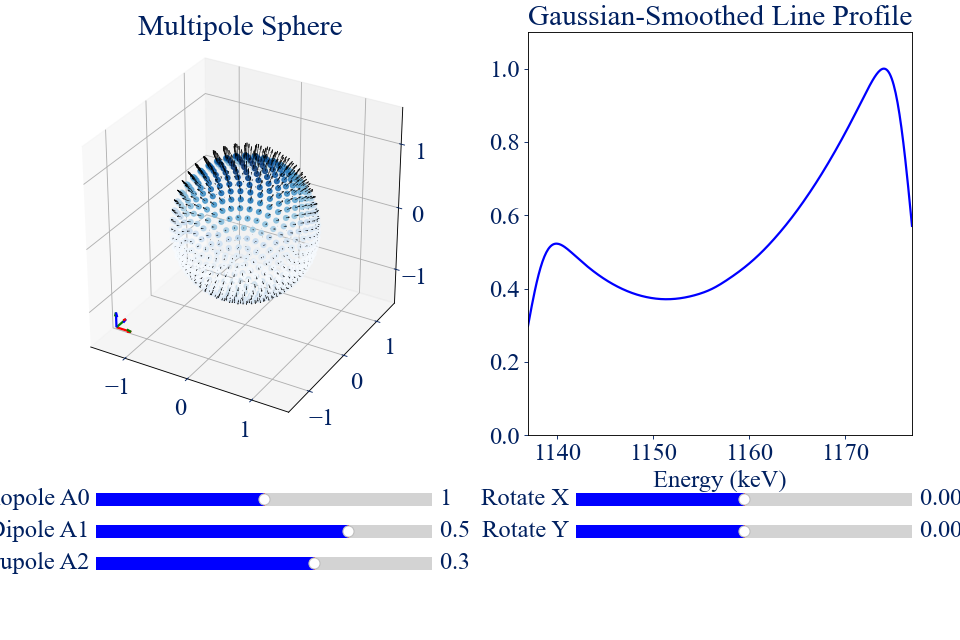

In [13]:
%matplotlib widget

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.widgets import Slider
from mpl_toolkits.mplot3d import Axes3D

# ============================================================
# 1. Fibonacci sphere for uniform point distribution
# ============================================================
def fibonacci_sphere(N):
    i = np.arange(N)
    phi = np.pi * (3. - np.sqrt(5.))  # golden angle
    y = 1 - 2*(i + 0.5)/N
    r = np.sqrt(1 - y*y)
    theta = phi * i
    x = r * np.cos(theta)
    z = r * np.sin(theta)
    return np.vstack((x, y, z)).T

# ============================================================
# 2. Rotation matrices
# ============================================================
def R_x(angle):
    c, s = np.cos(angle), np.sin(angle)
    return np.array([[1,0,0],[0,c,-s],[0,s,c]])

def R_y(angle):
    c, s = np.cos(angle), np.sin(angle)
    return np.array([[c,0,s],[0,1,0],[-s,0,c]])

# ============================================================
# 3. Gaussian smoothing
# ============================================================
def smooth_profile(v_los, weights, sigma=0.08, v_grid=None):
    diff = v_grid[:, None] - v_los[None, :]
    kernel = np.exp(-0.5 * (diff / sigma)**2)
    profile = kernel @ weights
    if np.max(profile) > 0:
        profile /= np.max(profile)
    return profile

# ============================================================
# 4. Parameters
# ============================================================
N = 800
v0 = 1.0
sigma = 0.08
nv = 400
v_grid = np.linspace(-v0, v0, nv)

# Uniform sphere points
r_hat = fibonacci_sphere(N)

# LOS direction = +z
los = np.array([0, 0, 1])

# ============================================================
# 5. Multipole weighting
# ============================================================
def compute_weights(r, axis, A0, A1, A2):
    dot = r @ axis
    return A0 + A1*dot + A2*(3*dot**2 - 1)

# ============================================================
# 6. Figure layout
# ============================================================
fig = plt.figure(figsize=(12, 8))

# Move panels upward to create more space below
ax_sphere = fig.add_subplot(121, projection='3d')
ax_sphere.set_position([0.05, 0.32, 0.40, 0.63])

ax_profile = fig.add_subplot(122)
ax_profile.set_position([0.55, 0.32, 0.40, 0.63])

# Initial multipole strengths
A0_init, A1_init, A2_init = 1.0, 0.5, 0.3
rotX_init, rotY_init = 0.0, 0.0

# Initial multipole axis = +z
axis0 = np.array([0,0,1])

# Initial weights
w0 = compute_weights(r_hat, axis0, A0_init, A1_init, A2_init)
w_norm0 = (w0 - w0.min()) / (w0.max() - w0.min())

# Sphere scatter
scatter = ax_sphere.scatter(
    r_hat[:,0], r_hat[:,1], r_hat[:,2],
    c=w_norm0, cmap="Blues", s=20,
    vmin=0, vmax=1)

# Velocity arrows
vectors0 = r_hat * w_norm0[:, None]
quiver = ax_sphere.quiver(
    r_hat[:,0], r_hat[:,1], r_hat[:,2],
    vectors0[:,0], vectors0[:,1], vectors0[:,2],
    length=0.2, normalize=False, color="black", linewidth=0.5
)

# Orientation triad
triad_origin = np.array([-1.3, -1.3, -1.3])
triad_dirs = np.array([[0.6,0,0],[0,0.6,0],[0,0,0.6]])
triad_colors = ["red","green","blue"]
triad = ax_sphere.quiver(
    triad_origin[0], triad_origin[1], triad_origin[2],
    triad_dirs[:,0], triad_dirs[:,1], triad_dirs[:,2],
    length=0.4, normalize=False, colors=triad_colors, linewidth=2
)

# ax_sphere.text(-1.3+0.45, -1.3, -1.3, "x", color="red")
# ax_sphere.text(-1.3, -1.3+0.45, -1.3, "y", color="green")
# ax_sphere.text(-1.3, -1.3, -1.3+0.45, "z(view)", color="blue")

ax_sphere.set_xlim([-1.5,1.5])
ax_sphere.set_ylim([-1.5,1.5])
ax_sphere.set_zlim([-1.5,1.5])
ax_sphere.set_box_aspect([1,1,1])
ax_sphere.set_title("Multipole Sphere")

# Initial line profile
v_los0 = v0 * (r_hat @ los)
profile0 = smooth_profile(v_los0, w0, sigma, v_grid)
line, = ax_profile.plot(v_grid, profile0, lw=2)
ax_profile.set_ylim([0,1.1])
ax_profile.set_xlim([-v0,v0])
ax_profile.set_xlabel('Energy (keV)')
ax_profile.set_xticks((np.array([1140, 1150, 1160, 1170]) - 1157) / 20)
ax_profile.set_xticklabels(np.array([1140, 1150, 1160, 1170]))
ax_profile.set_title("Gaussian-Smoothed Line Profile")

# ============================================================
# 7. Sliders (now placed farther below the panels)
# ============================================================
axcolor = 'lightgoldenrodyellow'

# Sliders moved down to y = 0.20, 0.15, 0.10, 0.05
ax_A0 = plt.axes([0.10, 0.20, 0.35, 0.04], facecolor=axcolor)
ax_A1 = plt.axes([0.10, 0.15, 0.35, 0.04], facecolor=axcolor)
ax_A2 = plt.axes([0.10, 0.10, 0.35, 0.04], facecolor=axcolor)

ax_rotX = plt.axes([0.6, 0.20, 0.35, 0.04], facecolor=axcolor)
ax_rotY = plt.axes([0.6, 0.15, 0.35, 0.04], facecolor=axcolor)

sA0 = Slider(ax_A0, 'Monopole A0', 0.0, 2.0, valinit=A0_init)
sA1 = Slider(ax_A1, 'Dipole A1', -1.0, 1.0, valinit=A1_init)
sA2 = Slider(ax_A2, 'Quadrupole A2', -1.0, 1.0, valinit=A2_init)

sRotX = Slider(ax_rotX, 'Rotate X', -np.pi, np.pi, valinit=rotX_init)
sRotY = Slider(ax_rotY, 'Rotate Y', -np.pi, np.pi, valinit=rotY_init)

# ============================================================
# 8. Update function
# ============================================================
def update(val):
    global quiver

    A0, A1, A2 = sA0.val, sA1.val, sA2.val
    rotX, rotY = sRotX.val, sRotY.val

    # Rotation matrix
    R = R_y(rotY) @ R_x(rotX)

    # Rotate sphere points
    r_rot = (R @ r_hat.T).T
    x_r, y_r, z_r = r_rot[:,0], r_rot[:,1], r_rot[:,2]

    # Rotate multipole axis
    axis_rot = R @ axis0

    # LOS stays fixed along +z
    v_los_rot = v0 * (r_rot @ los)

    # Multipole weights
    w = compute_weights(r_rot, axis_rot, A0, A1, A2)
    w_norm = (w - w.min()) / (w.max() - w.min())

    # Update sphere
    scatter._offsets3d = (x_r, y_r, z_r)
    scatter.set_array(w_norm)
    scatter.set_clim(0, 1)

    # Update velocity arrows
    quiver.remove()
    vectors = r_rot * w_norm[:, None]
    quiver = ax_sphere.quiver(
        x_r, y_r, z_r,
        vectors[:,0], vectors[:,1], vectors[:,2],
        length=0.2, normalize=False, color="black", linewidth=0.5
    )

    # Update line profile
    profile = smooth_profile(v_los_rot, w, sigma, v_grid)
    line.set_ydata(profile)

    fig.canvas.draw_idle()

# Connect sliders
sA0.on_changed(update)
sA1.on_changed(update)
sA2.on_changed(update)
sRotX.on_changed(update)
sRotY.on_changed(update)

plt.show()


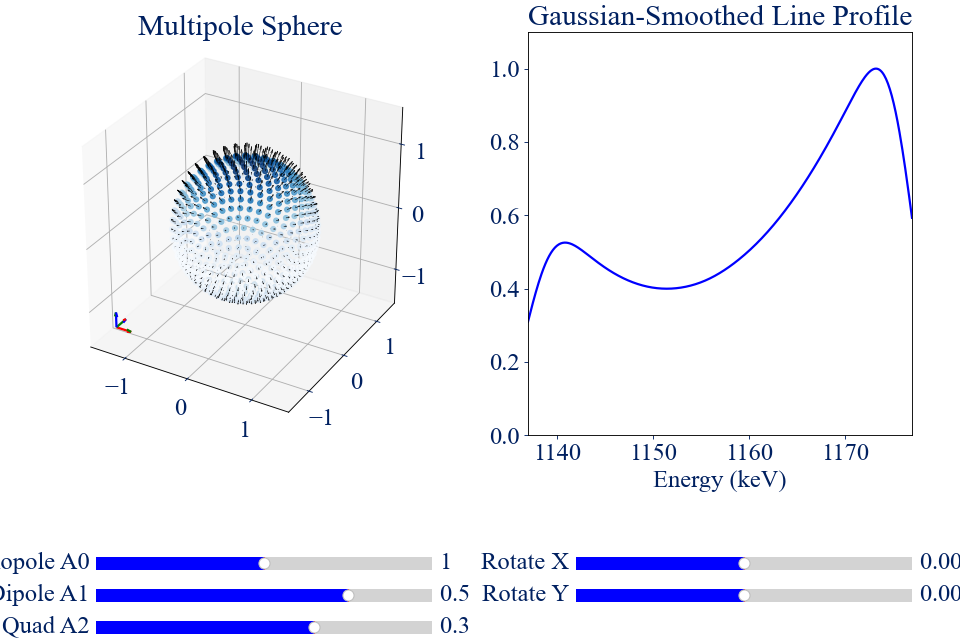

In [3]:
%matplotlib widget

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.widgets import Slider
from mpl_toolkits.mplot3d import Axes3D

# ============================================================
# 1. Fibonacci sphere for uniform point distribution
# ============================================================
def fibonacci_sphere(N):
    i = np.arange(N)
    phi = np.pi * (3. - np.sqrt(5.))  # golden angle
    y = 1 - 2*(i + 0.5)/N
    r = np.sqrt(1 - y*y)
    theta = phi * i
    x = r * np.cos(theta)
    z = r * np.sin(theta)
    return np.vstack((x, y, z)).T

# ============================================================
# 2. Rotation matrices
# ============================================================
def R_x(angle):
    c, s = np.cos(angle), np.sin(angle)
    return np.array([[1,0,0],[0,c,-s],[0,s,c]])

def R_y(angle):
    c, s = np.cos(angle), np.sin(angle)
    return np.array([[c,0,s],[0,1,0],[-s,0,c]])

# ============================================================
# 3. Gaussian smoothing
# ============================================================
def smooth_profile(v_los, weights, sigma=0.08, v_grid=None):
    diff = v_grid[:, None] - v_los[None, :]
    kernel = np.exp(-0.5 * (diff / sigma)**2)
    profile = kernel @ weights
    if np.max(profile) > 0:
        profile /= np.max(profile)
    return profile

# ============================================================
# 4. Parameters
# ============================================================
N = 800
v0 = 1.0
sigma = 0.1125
nv = 400
v_grid = np.linspace(-v0, v0, nv)

# Uniform sphere points
r_hat = fibonacci_sphere(N)

# LOS direction = +z
los = np.array([0, 0, 1])

# ============================================================
# 5. Multipole weighting (quadrupole m=0 and m=2)
# ============================================================
def axis_frame(axis):
    """Build an orthonormal basis (e1, e2, e3) with e3 = axis."""
    e3 = axis / np.linalg.norm(axis)
    # pick a vector not parallel to e3
    if abs(e3[0]) < 0.9:
        tmp = np.array([1.0, 0.0, 0.0])
    else:
        tmp = np.array([0.0, 1.0, 0.0])
    e1 = np.cross(tmp, e3)
    e1 /= np.linalg.norm(e1)
    e2 = np.cross(e3, e1)
    return e1, e2, e3

def compute_weights(r, axis, A0, A1, A2, frac_m2):
    """
    A2 is total quadrupole amplitude.
    frac_m2 in [0,1] sets how much of A2 goes into m=2 vs m=0:
      A20 = A2 * (1 - frac_m2)
      A22 = A2 * frac_m2
    """
    A20 = A2 * (1.0 - frac_m2)
    A22 = A2 * frac_m2

    e1, e2, e3 = axis_frame(axis)

    # coordinates in the multipole frame
    x_p = r @ e1
    y_p = r @ e2
    z_p = r @ e3

    phi = np.arctan2(y_p, x_p)

    # quadrupole components
    Q0 = 3.0 * z_p**2 - 1.0
    Q2 = (1.0 - z_p**2) * np.cos(2.0 * phi)

    return A0 + A1*z_p + A20*Q0 + A22*Q2

# ============================================================
# 6. Figure layout
# ============================================================
fig = plt.figure(figsize=(12, 8))

# Move panels upward to create more space below
ax_sphere = fig.add_subplot(121, projection='3d')
ax_sphere.set_position([0.05, 0.32, 0.40, 0.63])

ax_profile = fig.add_subplot(122)
ax_profile.set_position([0.55, 0.32, 0.40, 0.63])

# Initial multipole strengths
A0_init, A1_init, A2_init = 1.0, 0.5, 0.3
frac_m2_init = 0.0  # start with pure m=0
rotX_init, rotY_init = 0.0, 0.0

# Initial multipole axis = +z
axis0 = np.array([0,0,1])

# Initial weights
w0 = compute_weights(r_hat, axis0, A0_init, A1_init, A2_init, frac_m2_init)
w_norm0 = (w0 - w0.min()) / (w0.max() - w0.min())

# Sphere scatter
scatter = ax_sphere.scatter(
    r_hat[:,0], r_hat[:,1], r_hat[:,2],
    c=w_norm0, cmap="Blues", s=20,
    vmin=0, vmax=1)

# Velocity arrows
vectors0 = r_hat * w_norm0[:, None]
quiver = ax_sphere.quiver(
    r_hat[:,0], r_hat[:,1], r_hat[:,2],
    vectors0[:,0], vectors0[:,1], vectors0[:,2],
    length=0.2, normalize=False, color="black", linewidth=0.5
)

# Orientation triad
triad_origin = np.array([-1.3, -1.3, -1.3])
triad_dirs = np.array([[0.6,0,0],[0,0.6,0],[0,0,0.6]])
triad_colors = ["red","green","blue"]
triad = ax_sphere.quiver(
    triad_origin[0], triad_origin[1], triad_origin[2],
    triad_dirs[:,0], triad_dirs[:,1], triad_dirs[:,2],
    length=0.4, normalize=False, colors=triad_colors, linewidth=2
)

ax_sphere.set_xlim([-1.5,1.5])
ax_sphere.set_ylim([-1.5,1.5])
ax_sphere.set_zlim([-1.5,1.5])
ax_sphere.set_box_aspect([1,1,1])
ax_sphere.set_title("Multipole Sphere")

# Initial line profile
v_los0 = v0 * (r_hat @ los)
profile0 = smooth_profile(v_los0, w0, sigma, v_grid)
line, = ax_profile.plot(v_grid, profile0, lw=2)
ax_profile.set_ylim([0,1.1])
ax_profile.set_xlim([-v0,v0])
ax_profile.set_xlabel('Energy (keV)')
ax_profile.set_xticks((np.array([1140, 1150, 1160, 1170]) - 1157) / 20)
ax_profile.set_xticklabels(np.array([1140, 1150, 1160, 1170]))
ax_profile.set_title("Gaussian-Smoothed Line Profile")

# ============================================================
# 7. Sliders (now placed farther below the panels)
# ============================================================
axcolor = 'lightgoldenrodyellow'

ax_A0    = plt.axes([0.10, 0.10, 0.35, 0.04], facecolor=axcolor)
ax_A1    = plt.axes([0.10, 0.05, 0.35, 0.04], facecolor=axcolor)
ax_A2    = plt.axes([0.10, 0.00, 0.35, 0.04], facecolor=axcolor)
ax_frac2 = plt.axes([0.10, -0.05, 0.35, 0.04], facecolor=axcolor)

ax_rotX = plt.axes([0.6, 0.10, 0.35, 0.04], facecolor=axcolor)
ax_rotY = plt.axes([0.6, 0.05, 0.35, 0.04], facecolor=axcolor)

sA0    = Slider(ax_A0,    'Monopole A0', 0.0, 2.0, valinit=A0_init)
sA1    = Slider(ax_A1,    'Dipole A1',  -1.0, 1.0, valinit=A1_init)
sA2    = Slider(ax_A2,    'Quad A2',    -1.0, 1.0, valinit=A2_init)
sFrac2 = Slider(ax_frac2, 'Quad m2 frac', 0.0, 1.0, valinit=frac_m2_init)

sRotX = Slider(ax_rotX, 'Rotate X', -np.pi, np.pi, valinit=rotX_init)
sRotY = Slider(ax_rotY, 'Rotate Y', -np.pi, np.pi, valinit=rotY_init)

# ============================================================
# 8. Update function
# ============================================================
def update(val):
    global quiver

    A0    = sA0.val
    A1    = sA1.val
    A2    = sA2.val
    frac2 = sFrac2.val
    rotX  = sRotX.val
    rotY  = sRotY.val

    # Rotation matrix
    R = R_y(rotY) @ R_x(rotX)

    # Rotate sphere points
    r_rot = (R @ r_hat.T).T
    x_r, y_r, z_r = r_rot[:,0], r_rot[:,1], r_rot[:,2]

    # Rotate multipole axis
    axis_rot = R @ axis0

    # LOS stays fixed along +z
    v_los_rot = v0 * (r_rot @ los)

    # Multipole weights (with m=0 and m=2 quadrupole)
    w = compute_weights(r_rot, axis_rot, A0, A1, A2, frac2)
    w_norm = (w - w.min()) / (w.max() - w.min())

    # Update sphere
    scatter._offsets3d = (x_r, y_r, z_r)
    scatter.set_array(w_norm)
    scatter.set_clim(0, 1)

    # Update velocity arrows
    quiver.remove()
    vectors = r_rot * w_norm[:, None]
    quiver = ax_sphere.quiver(
        x_r, y_r, z_r,
        vectors[:,0], vectors[:,1], vectors[:,2],
        length=0.2, normalize=False, color="black", linewidth=0.5
    )

    # Update line profile
    profile = smooth_profile(v_los_rot, w, sigma, v_grid)
    line.set_ydata(profile)

    fig.canvas.draw_idle()

# Connect sliders
sA0.on_changed(update)
sA1.on_changed(update)
sA2.on_changed(update)
sFrac2.on_changed(update)
sRotX.on_changed(update)
sRotY.on_changed(update)

plt.show()
